In [1]:
import math
import os
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import ripser
from gtda.mapper import (
    CubicalCover,
    make_mapper_pipeline,
    plot_static_mapper_graph,
)
from scipy.sparse.csgraph import connected_components
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import FunctionTransformer
from umap import UMAP

np.random.seed(42)

# Academic styling configured for 2x2 multi-panel figures
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 16,
    "axes.titleweight": "bold",
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 12,
    "figure.titlesize": 18,
    "lines.linewidth": 2.2,
    "lines.markersize": 7,
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "savefig.bbox": "tight",
})


def calculate_diameter(data, is_distance_matrix=False):
    """Calculate the exact diameter of a point cloud or distance matrix."""
    if is_distance_matrix:
        return float(np.max(data))
    distances = pdist(data)
    return float(np.max(distances))


def calculate_correlation_distance(corr_matrix, metric="linear"):
    """Convert a square correlation matrix into a distance matrix."""
    corr = np.asarray(corr_matrix, dtype=float)
    if corr.ndim != 2 or corr.shape[0] != corr.shape[1]:
        raise ValueError("corr_matrix must be a square 2D array.")

    if metric == "angular":
        dist = np.sqrt(np.clip(2.0 * (1.0 - corr), 0.0, None))
    elif metric == "absolute":
        dist = 1.0 - np.abs(corr)
    else:
        dist = 1.0 - corr

    dist = (dist + dist.T) / 2.0
    np.fill_diagonal(dist, 0.0)
    dist[dist < 0] = 0.0
    return dist


def calculate_partitions(L, epsilon, alpha):
    """Calculate partition count N directly using effective epsilon."""
    shift = epsilon * (1.0 - alpha / 100.0)
    if shift <= 0 or (L - epsilon) < 0:
        return 1
    return math.floor((L - epsilon) / shift) + 1


def find_connected_components(data, R):
    """Find connected components in the Vietoris-Rips complex at threshold R."""
    dist_matrix = squareform(pdist(data))
    adjacency_matrix = (dist_matrix <= R).astype(int)
    n_components, labels = connected_components(
        adjacency_matrix, directed=False
    )
    return [data[labels == i] for i in range(n_components)]


def plot_persistence_diagram(persistence_diagrams, label_prefix, save_path=None):
    """Plot and save the persistence diagram."""
    plt.figure(figsize=(6, 6))
    for i, diagram in enumerate(persistence_diagrams):
        if len(diagram) > 0:
            plt.scatter(
                diagram[:, 0],
                diagram[:, 1],
                label=rf"$H_{i}$",
                alpha=0.7,
                edgecolor="none",
            )

    finite_pts = [d[~np.isinf(d)] for d in persistence_diagrams if len(d) > 0]
    if finite_pts:
        all_vals = np.concatenate(finite_pts)
        min_v, max_v = np.min(all_vals), np.max(all_vals)
        plt.plot([min_v, max_v], [min_v, max_v], "k--", alpha=0.5, linewidth=1.5)

    plt.title(f"Persistence Diagram ({label_prefix})")
    plt.xlabel("Birth")
    plt.ylabel("Death")
    plt.legend(frameon=True)
    plt.grid(True, linestyle=":", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()


def calculate_betti_curves(persistence_diagrams, resolution=1000):
    """Calculate Betti curves from Ripser persistence diagrams."""
    dim_0_points = persistence_diagrams[0]
    dim_1_points = persistence_diagrams[1]
    dim_0_points = dim_0_points[~np.isinf(dim_0_points[:, 1])]

    if len(dim_1_points) == 0:
        all_finite_values = dim_0_points.flatten()
    else:
        all_finite_values = np.concatenate(
            [dim_0_points.flatten(), dim_1_points.flatten()]
        )
    all_finite_values = all_finite_values[~np.isinf(all_finite_values)]

    if len(all_finite_values) == 0:
        return np.linspace(0, 1, resolution), np.zeros(resolution), np.zeros(resolution)

    min_val = np.min(all_finite_values)
    max_val = np.max(all_finite_values)

    x_values = np.linspace(min_val, max_val, resolution)
    betti_0 = np.zeros(resolution)
    betti_1 = np.zeros(resolution)

    for i, x in enumerate(x_values):
        betti_0[i] = np.sum(
            (dim_0_points[:, 0] <= x) & (x <= dim_0_points[:, 1])
        )
    if len(dim_1_points) > 0:
        for i, x in enumerate(x_values):
            betti_1[i] = np.sum(
                (dim_1_points[:, 0] <= x) & (x <= dim_1_points[:, 1])
            )

    return x_values, betti_0, betti_1


def plot_betti_curves(persistence_diagrams, title_suffix="", save_path=None):
    """Plot and save Betti-0 and Betti-1 curves."""
    x_vals, b0_curve, b1_curve = calculate_betti_curves(persistence_diagrams)
    plt.figure(figsize=(7, 6))
    plt.plot(x_vals, b0_curve, color="#1f77b4", label=r"$\beta_0$ (Components)")
    plt.plot(x_vals, b1_curve, color="#d62728", label=r"$\beta_1$ (Loops)")
    plt.xlabel(r"Filtration Threshold ($\epsilon$)")
    plt.ylabel("Betti Number")
    plt.title(f"Betti Curves {title_suffix}")
    plt.legend(frameon=True)
    plt.grid(True, linestyle=":", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()


def calculate_all_betti_ranges(persistence_diagrams, resolution=1000):
    """Extract threshold ranges for non-zero Betti-1 values."""
    x_values, _, betti_1 = calculate_betti_curves(
        persistence_diagrams, resolution=resolution
    )
    unique_betti_values = np.unique(betti_1)[::-1]

    betti_ranges = {}
    for betti_value in unique_betti_values:
        if betti_value == 0:
            continue
        betti_indices = np.where(betti_1 == betti_value)[0]
        if len(betti_indices) == 0:
            continue

        ranges = []
        start = betti_indices[0]
        for i in range(1, len(betti_indices)):
            if betti_indices[i] != betti_indices[i - 1] + 1:
                ranges.append((x_values[start], x_values[betti_indices[i - 1]]))
                start = betti_indices[i]
        ranges.append((x_values[start], x_values[betti_indices[-1]]))

        betti_ranges[betti_value] = ranges

    return betti_ranges


def plot_betti_curve_with_cutoffs(
    x_values, betti_1, betti_ranges, title_suffix="", save_path=None
):
    """Plot and save Betti-1 curve with marked threshold bounds using raw strings."""
    plt.figure(figsize=(7, 6))
    plt.plot(x_values, betti_1, label=r"$\beta_1$ Curve", color="#1f77b4")

    plotted_labels = set()
    for betti_value, ranges in betti_ranges.items():
        for r in ranges:
            start_lbl = (
                rf"Start $\beta_1={int(betti_value)}$"
                if f"start_{betti_value}" not in plotted_labels
                else ""
            )
            end_lbl = (
                rf"End $\beta_1={int(betti_value)}$"
                if f"end_{betti_value}" not in plotted_labels
                else ""
            )

            plt.axvline(
                x=r[0], color="#d62728", linestyle="--", alpha=0.7, label=start_lbl
            )
            plt.axvline(
                x=r[1], color="#2ca02c", linestyle="--", alpha=0.7, label=end_lbl
            )

            if start_lbl:
                plotted_labels.add(f"start_{betti_value}")
            if end_lbl:
                plotted_labels.add(f"end_{betti_value}")

    plt.xlabel(r"Filtration Threshold ($\epsilon$)")
    plt.ylabel(r"$\beta_1$ Value")
    plt.title(rf"$\beta_1$ Threshold Ranges {title_suffix}")
    plt.legend(frameon=True)
    plt.grid(True, linestyle=":", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()


def calculate_total_ranges(betti_ranges):
    """Calculate total persistent range per Betti-1 value, down-weighting single loops by 0.2."""
    total_ranges = {}
    for betti_value, ranges in betti_ranges.items():
        if betti_value == 1:
            total_range = sum((end - start) * 0.2 for start, end in ranges)
        else:
            total_range = sum(end - start for start, end in ranges)
        total_ranges[betti_value] = total_range
    return total_ranges


def find_max_betti(total_ranges):
    """Select the Betti-1 value with the largest combined persistent range."""
    max_betti = max(total_ranges, key=total_ranges.get)
    return max_betti, total_ranges[max_betti]


def calculate_mean_range_for_max_betti(betti_ranges, max_betti):
    """Calculate the midpoint for the selected max Betti number range."""
    ranges = betti_ranges[max_betti]
    lowest_value = min(start for start, end in ranges)
    highest_value = max(end for start, end in ranges)
    return (lowest_value + highest_value) / 2.0


def plot_vietoris_rips_complex(
    data, R, label="data", col=1, maxdim=2, save_path=None
):
    """Plot and save 2D Vietoris-Rips complex using threshold radius R."""
    tab10 = plt.colormaps.get_cmap("tab10")
    viridis = plt.colormaps.get_cmap("viridis")

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_title(rf"VR Complex ($\epsilon = {R:.4f}$)")

    ax.scatter(
        data[:, 0],
        data[:, 1],
        label=label,
        s=30,
        alpha=0.9,
        c=np.array([tab10(col)] * len(data)),
        edgecolors="none",
    )

    for xy in data:
        ax.add_patch(
            mpatches.Circle(
                xy,
                radius=R,
                fill=False,
                edgecolor=tab10(col),
                alpha=0.15,
                linestyle="dotted",
                linewidth=1.2,
            )
        )

    for i, xy in enumerate(data):
        for j in range(i + 1, len(data)):
            pq = data[j]
            if np.linalg.norm(xy - pq) <= R:
                ax.plot(
                    [xy[0], pq[0]],
                    [xy[1], pq[1]],
                    color=tab10(col),
                    alpha=0.6,
                    linewidth=1.5,
                )

    if maxdim >= 2:
        triangle_index = 0
        for i, xy in enumerate(data):
            for j in range(i + 1, len(data)):
                pq = data[j]
                if np.linalg.norm(xy - pq) <= R:
                    for k_idx in range(j + 1, len(data)):
                        ab = data[k_idx]
                        if (
                            np.linalg.norm(xy - ab) <= R
                            and np.linalg.norm(pq - ab) <= R
                        ):
                            triangle = np.array([xy, pq, ab])
                            color = viridis(triangle_index / max(1, len(data)))
                            ax.fill(
                                triangle[:, 0],
                                triangle[:, 1],
                                color=color,
                                alpha=0.4,
                            )
                            triangle_index += 1

    ax.axis("equal")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()

    return find_connected_components(data, R)


def run_topological_analysis(
    data_points,
    label_prefix="Dataset",
    distance_matrix=False,
    output_dir="figures",
):
    """Run persistent homology, display and save diagnostics, and return scale parameters."""
    safe_label = (
        label_prefix.replace(" ", "_")
        .replace("=", "_")
        .replace("%", "")
        .replace("(", "")
        .replace(")", "")
    )

    result = ripser.ripser(
        data_points, distance_matrix=distance_matrix, do_cocycles=False
    )
    persistence_diagrams = result["dgms"]

    # 1. Persistence Diagram
    pd_save_path = os.path.join(output_dir, f"pd_{safe_label}.png")
    plot_persistence_diagram(persistence_diagrams, label_prefix, save_path=pd_save_path)

    # 2. Betti Curves
    x_values, _, betti_1 = calculate_betti_curves(persistence_diagrams)
    betti_save_path = os.path.join(output_dir, f"betti_{safe_label}.png")
    plot_betti_curves(
        persistence_diagrams,
        title_suffix=f"({label_prefix})",
        save_path=betti_save_path,
    )

    betti_ranges = calculate_all_betti_ranges(persistence_diagrams)
    if not betti_ranges:
        print(f"[{label_prefix}] No non-zero Betti-1 loops detected.")
        return None, 0, betti_ranges

    for betti_value, ranges in sorted(betti_ranges.items(), reverse=True):
        for r in ranges:
            print(
                f"[{label_prefix}] Betti-1 value {betti_value} has range"
                f" [{r[0]:.4f}, {r[1]:.4f}]"
            )

    # 3. Betti Cutoff Curves
    cutoff_save_path = os.path.join(output_dir, f"cutoff_{safe_label}.png")
    plot_betti_curve_with_cutoffs(
        x_values,
        betti_1,
        betti_ranges,
        title_suffix=f"({label_prefix})",
        save_path=cutoff_save_path,
    )

    total_ranges = calculate_total_ranges(betti_ranges)
    for betti_value, total_range in sorted(total_ranges.items(), reverse=True):
        print(
            f"[{label_prefix}] Betti-1 value {betti_value} total range:"
            f" {total_range:.4f}"
        )

    max_betti, max_range = find_max_betti(total_ranges)
    print(
        f"\n[{label_prefix}] Highest range Betti-1: {max_betti} (total range ="
        f" {max_range:.4f})"
    )

    raw_epsilon = calculate_mean_range_for_max_betti(betti_ranges, max_betti)
    print(f"[{label_prefix}] Raw midpoint epsilon threshold: {raw_epsilon:.4f}")

    return raw_epsilon, max_betti, betti_ranges


def process_correlation_data(
    corr_matrix,
    cutoff_betti=0,
    distance_metric="linear",
    resolution_multiplier=2.0,
    output_dir="figures",
    umap_kwargs=None,
    alpha_values=None,
):
    """Execute topological analysis and Mapper pipeline, returning scaled effective epsilon."""
    os.makedirs(output_dir, exist_ok=True)

    if umap_kwargs is None:
        umap_kwargs = dict(
            metric="precomputed",
            n_neighbors=15,
            min_dist=0.1,
            n_components=2,
            random_state=42,
        )
    if alpha_values is None:
        alpha_values = [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]

    print("=== Step 1: Distance Matrix and Diameter Computation ===")
    dist_matrix = calculate_correlation_distance(
        corr_matrix, metric=distance_metric
    )
    L_dist = calculate_diameter(dist_matrix, is_distance_matrix=True)
    print(f"Correlation Distance Diameter (L_dist): {L_dist:.4f}")

    # Persistent Homology on distance matrix
    raw_epsilon_1, Betti_1_1, _ = run_topological_analysis(
        dist_matrix,
        label_prefix="Correlation Matrix",
        distance_matrix=True,
        output_dir=output_dir,
    )
    if raw_epsilon_1 is None:
        print("No valid Betti-1 loops detected.")
        return pd.DataFrame()

    # Scale epsilon down by resolution_multiplier
    epsilon_1 = raw_epsilon_1 / resolution_multiplier
    print(f"Raw Midpoint Epsilon: {raw_epsilon_1:.4f}")
    print(f"Effective Epsilon (epsilon_1): {epsilon_1:.4f}")
    print(f"Primary Loop Signature (Betti_1_1): {Betti_1_1}\n")

    # UMAP Filter Projection
    umap_embedding = UMAP(**umap_kwargs).fit_transform(dist_matrix)
    precomputed_lens = FunctionTransformer(lambda X: umap_embedding)

    plt.figure(figsize=(6, 6))
    plt.scatter(
        umap_embedding[:, 0],
        umap_embedding[:, 1],
        s=30,
        alpha=0.8,
        color="#1f77b4",
        edgecolors="none",
    )
    plt.title("UMAP 2D Lens Projection")
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.grid(True, linestyle=":", alpha=0.6)
    plt.tight_layout()
    umap_save_path = os.path.join(output_dir, "umap_lens_projection.png")
    plt.savefig(umap_save_path)
    plt.show()

    results = []
    for alpha in alpha_values:
        print("\n" + "=" * 50)
        print(f"Processing Mapper graph for alpha = {alpha}%")
        print("=" * 50)

        N = calculate_partitions(L_dist, epsilon_1, alpha)
        print(f"For alpha = {alpha}%, N = {N}")

        cover = CubicalCover(n_intervals=N, overlap_frac=alpha / 100)
        clusterer = DBSCAN()

        pipe = make_mapper_pipeline(
            filter_func=precomputed_lens,
            cover=cover,
            clusterer=clusterer,
            verbose=False,
            n_jobs=1,
        )

        try:
            fig = plot_static_mapper_graph(pipe, dist_matrix)
            fig.show(config={"scrollZoom": True})
        except Exception as e:
            print(f"Skipping static Mapper graph rendering: {e}")

        graph = pipe.fit_transform(dist_matrix)
        adjacency_matrix = np.array(graph.get_adjacency().data)

        if adjacency_matrix.shape[0] == 0:
            print("Mapper graph produced 0 nodes. Skipping.")
            continue

        nx_graph = nx.from_numpy_array(adjacency_matrix)
        pos = nx.spring_layout(nx_graph, iterations=100, seed=42)
        coords = np.array(list(pos.values()))

        # Normalize 2D layout coordinates
        max_layout_dist = (
            calculate_diameter(coords, is_distance_matrix=False)
            if len(coords) > 1
            else 1.0
        )
        if max_layout_dist > 0:
            coords = coords / max_layout_dist

        plt.figure(figsize=(6, 6))
        plt.scatter(
            coords[:, 0],
            coords[:, 1],
            s=35,
            color="#2ca02c",
            edgecolors="none",
        )
        plt.title(rf"Force-directed Layout ($\alpha = {alpha}\%$)")
        plt.xlabel("Layout Coordinate 1")
        plt.ylabel("Layout Coordinate 2")
        plt.grid(True, linestyle=":", alpha=0.6)
        plt.tight_layout()
        layout_save_path = os.path.join(output_dir, f"layout_alpha_{alpha}.png")
        plt.savefig(layout_save_path)
        plt.show()

        print(f"\n--- Topological Analysis on 2D Layout (alpha = {alpha}%) ---")
        raw_epsilon_2, Betti_1_2, _ = run_topological_analysis(
            coords,
            label_prefix=f"2D Layout alpha={alpha}%",
            distance_matrix=False,
            output_dir=output_dir,
        )

        if raw_epsilon_2 is None:
            print("No valid Betti-1 loops found on 2D layout.")
            continue

        epsilon_2 = raw_epsilon_2

        modulus_Betti = abs(Betti_1_1 - Betti_1_2)
        print(
            f"|Betti_1_1 - Betti_1_2| = |{Betti_1_1} - {Betti_1_2}| ="
            f" {modulus_Betti}"
        )

        if modulus_Betti <= cutoff_betti:
            print("Betti condition satisfied.")
            vr_save_path = os.path.join(output_dir, f"vr_complex_alpha_{alpha}.png")
            plot_vietoris_rips_complex(
                coords,
                R=epsilon_2,
                label="simplicial complex",
                maxdim=2,
                save_path=vr_save_path,
            )
            results.append({
                "%overlap": alpha,
                "N value": N,
                "Betti_1_1": Betti_1_1,
                "Betti_1_2": Betti_1_2,
                "epsilon_1": epsilon_1,
                "epsilon_2": epsilon_2,
            })
        else:
            print("Betti condition not satisfied.")

    df = pd.DataFrame(results)
    print("\nResults DataFrame:")
    print(df)
    return df

=== Step 1: Distance Matrix and Diameter Computation ===
Correlation Distance Diameter (L_dist): 1.4516


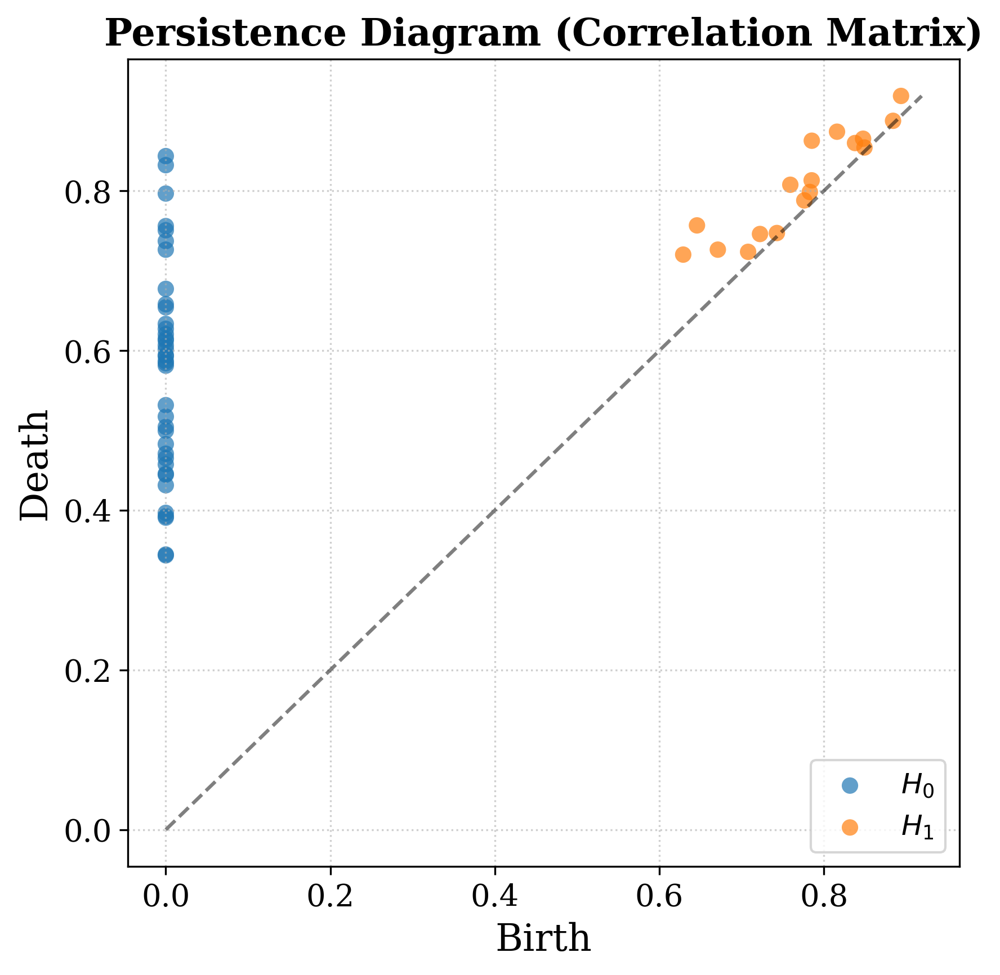

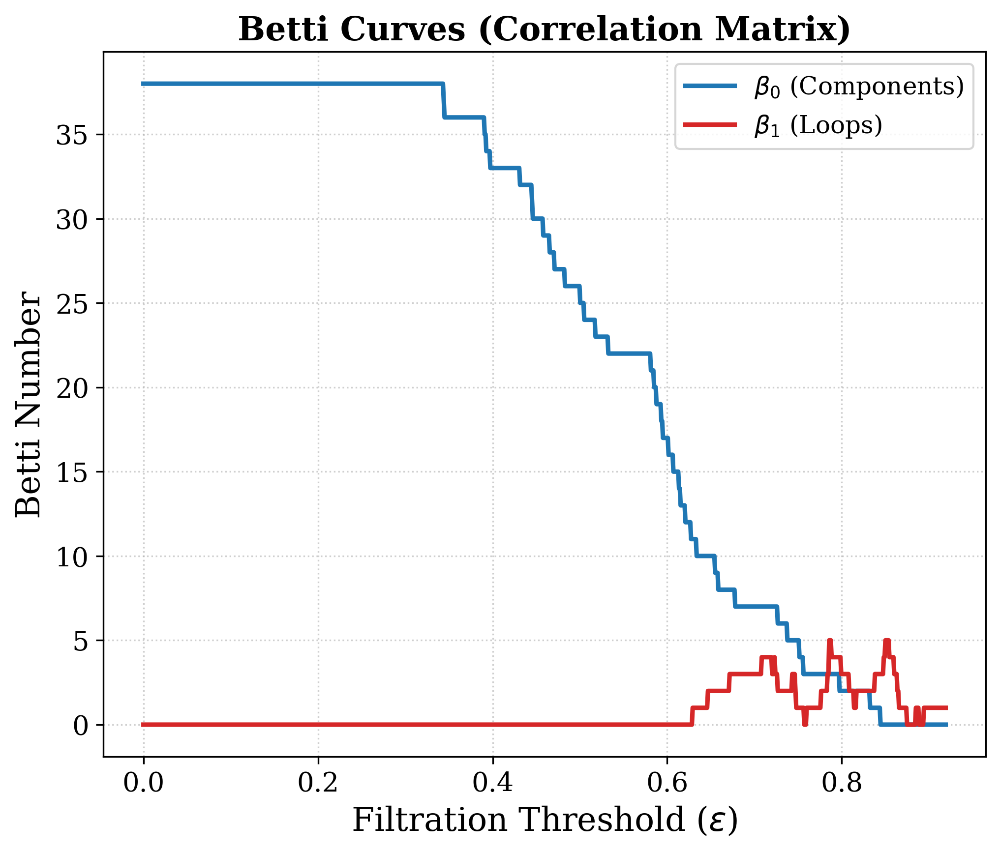

[Correlation Matrix] Betti-1 value 5.0 has range [0.7855, 0.7874]
[Correlation Matrix] Betti-1 value 5.0 has range [0.8499, 0.8536]
[Correlation Matrix] Betti-1 value 4.0 has range [0.7083, 0.7193]
[Correlation Matrix] Betti-1 value 4.0 has range [0.7230, 0.7230]
[Correlation Matrix] Betti-1 value 4.0 has range [0.7883, 0.7984]
[Correlation Matrix] Betti-1 value 4.0 has range [0.8481, 0.8490]
[Correlation Matrix] Betti-1 value 4.0 has range [0.8545, 0.8591]
[Correlation Matrix] Betti-1 value 3.0 has range [0.6715, 0.7073]
[Correlation Matrix] Betti-1 value 3.0 has range [0.7202, 0.7221]
[Correlation Matrix] Betti-1 value 3.0 has range [0.7239, 0.7257]
[Correlation Matrix] Betti-1 value 3.0 has range [0.7432, 0.7460]
[Correlation Matrix] Betti-1 value 3.0 has range [0.7837, 0.7846]
[Correlation Matrix] Betti-1 value 3.0 has range [0.7993, 0.8076]
[Correlation Matrix] Betti-1 value 3.0 has range [0.8380, 0.8472]
[Correlation Matrix] Betti-1 value 3.0 has range [0.8600, 0.8628]
[Correlati

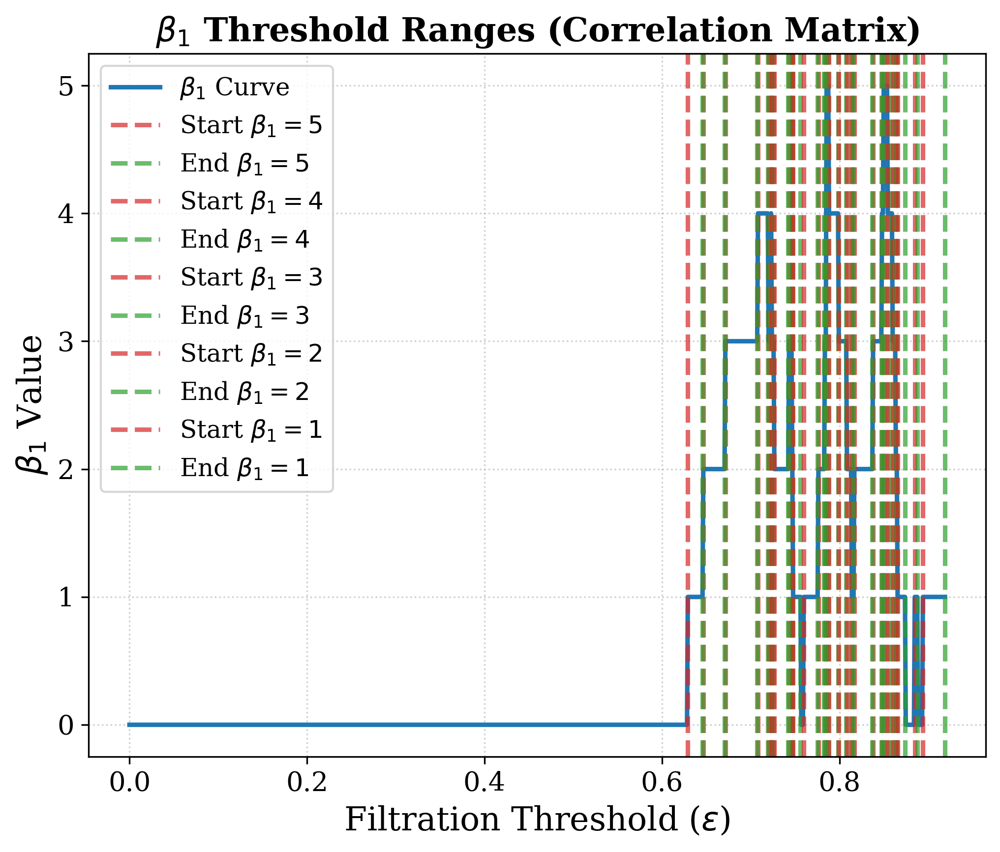

[Correlation Matrix] Betti-1 value 5.0 total range: 0.0055
[Correlation Matrix] Betti-1 value 4.0 total range: 0.0267
[Correlation Matrix] Betti-1 value 3.0 total range: 0.0635
[Correlation Matrix] Betti-1 value 2.0 total range: 0.0717
[Correlation Matrix] Betti-1 value 1.0 total range: 0.0156

[Correlation Matrix] Highest range Betti-1: 2.0 (total range = 0.0717)
[Correlation Matrix] Raw midpoint epsilon threshold: 0.7556
Raw Midpoint Epsilon: 0.7556
Effective Epsilon (epsilon_1): 0.3778
Primary Loop Signature (Betti_1_1): 2.0



C:\Users\nasee\anaconda3.1\Lib\site-packages\umap\umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


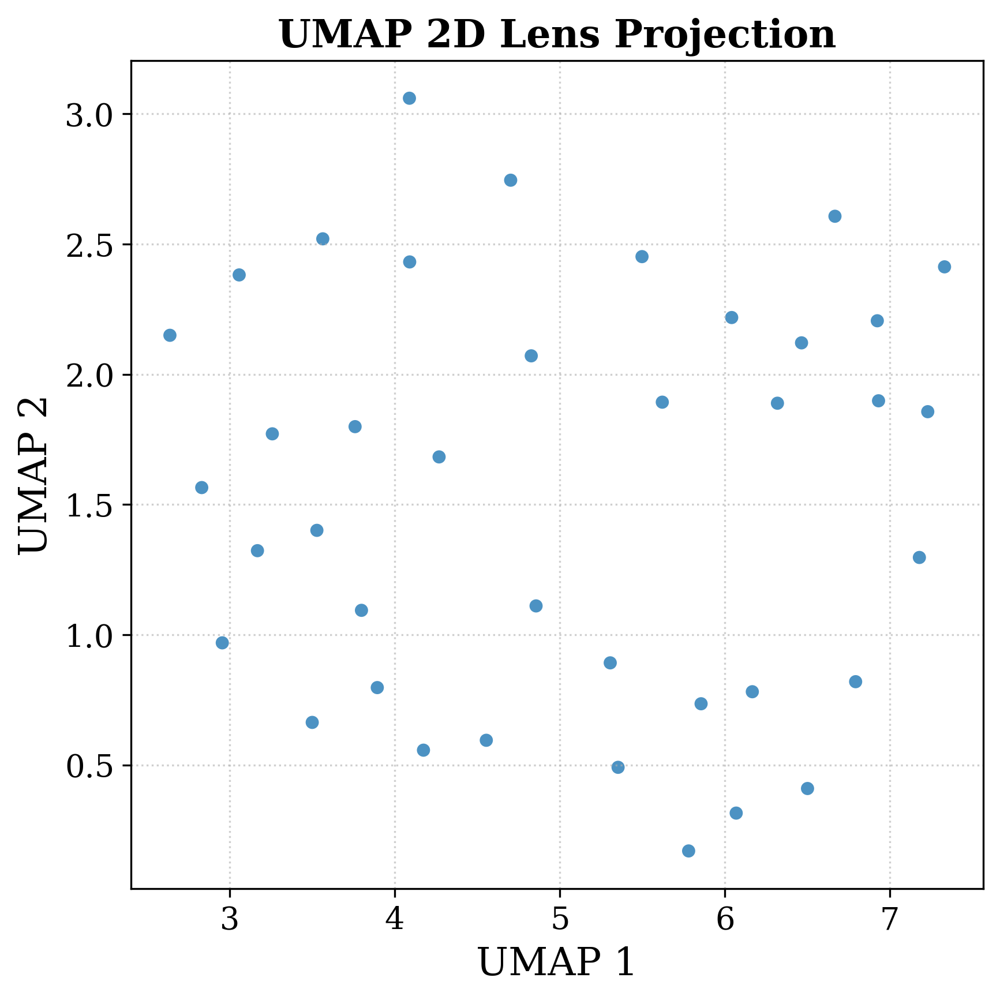


Processing Mapper graph for alpha = 10%
For alpha = 10%, N = 4


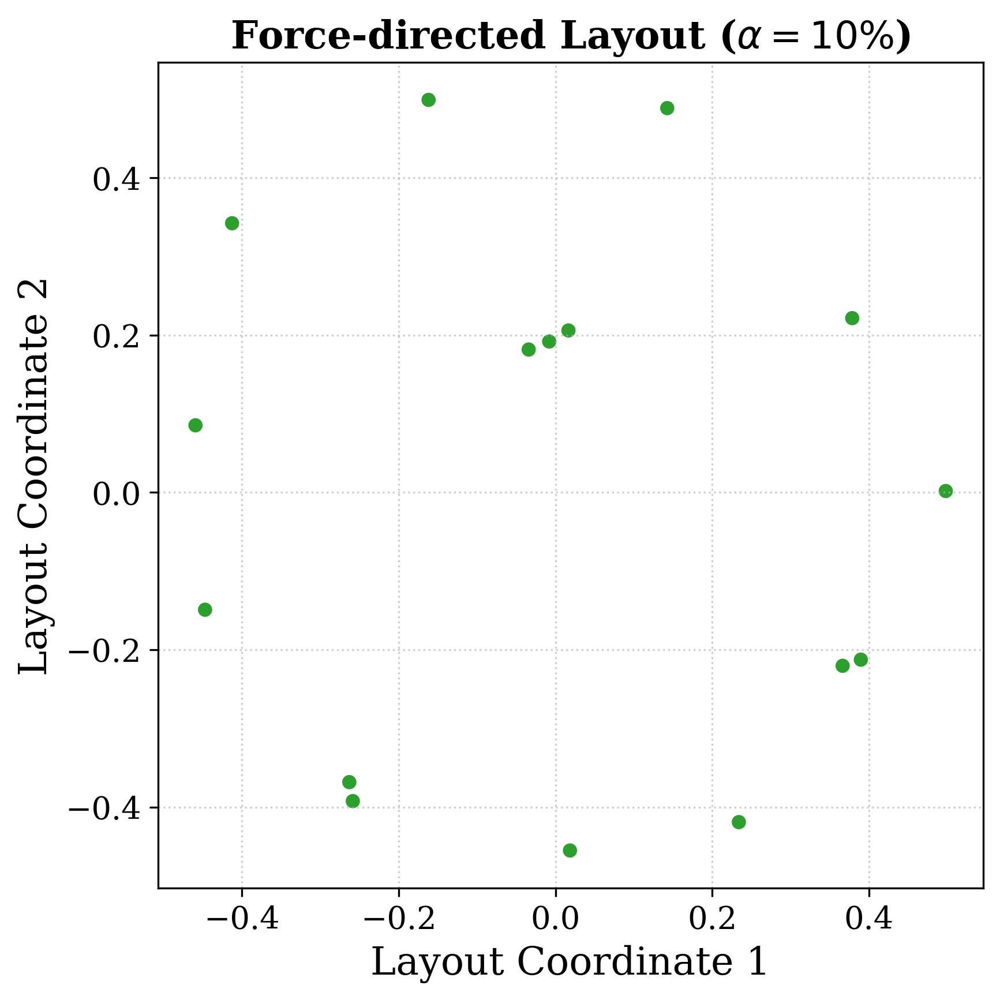


--- Topological Analysis on 2D Layout (alpha = 10%) ---


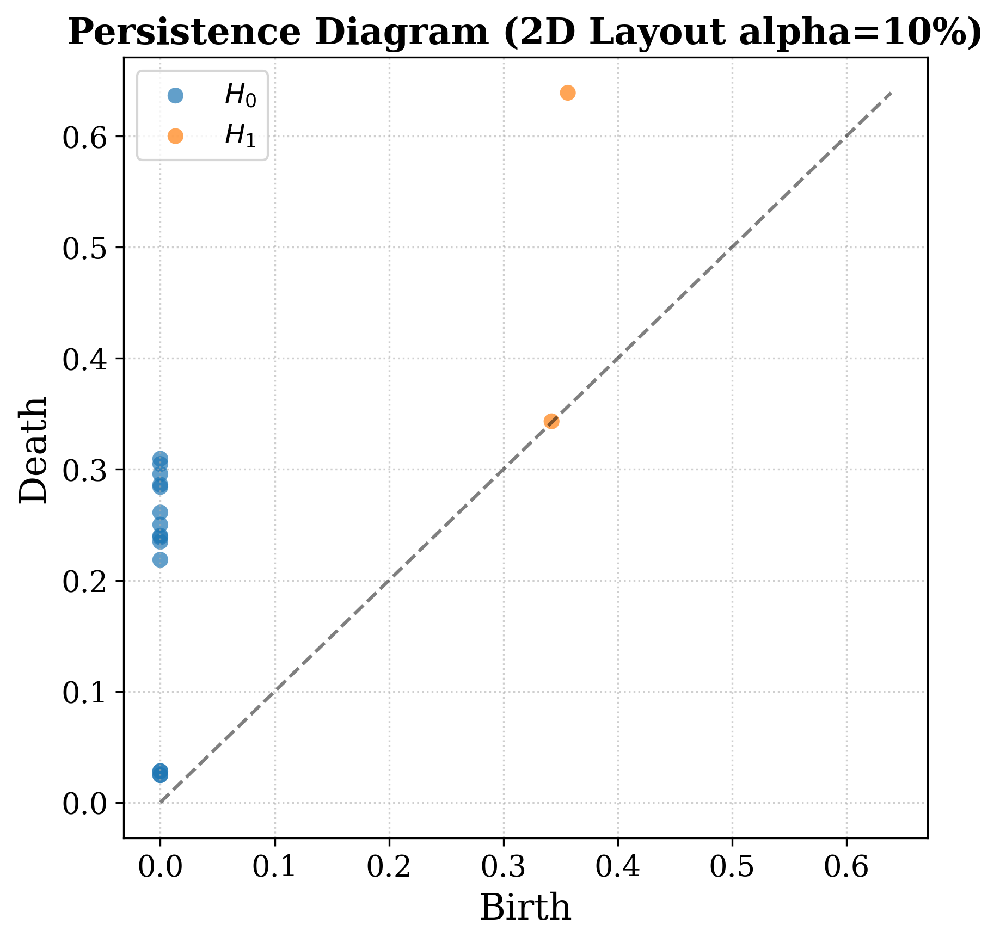

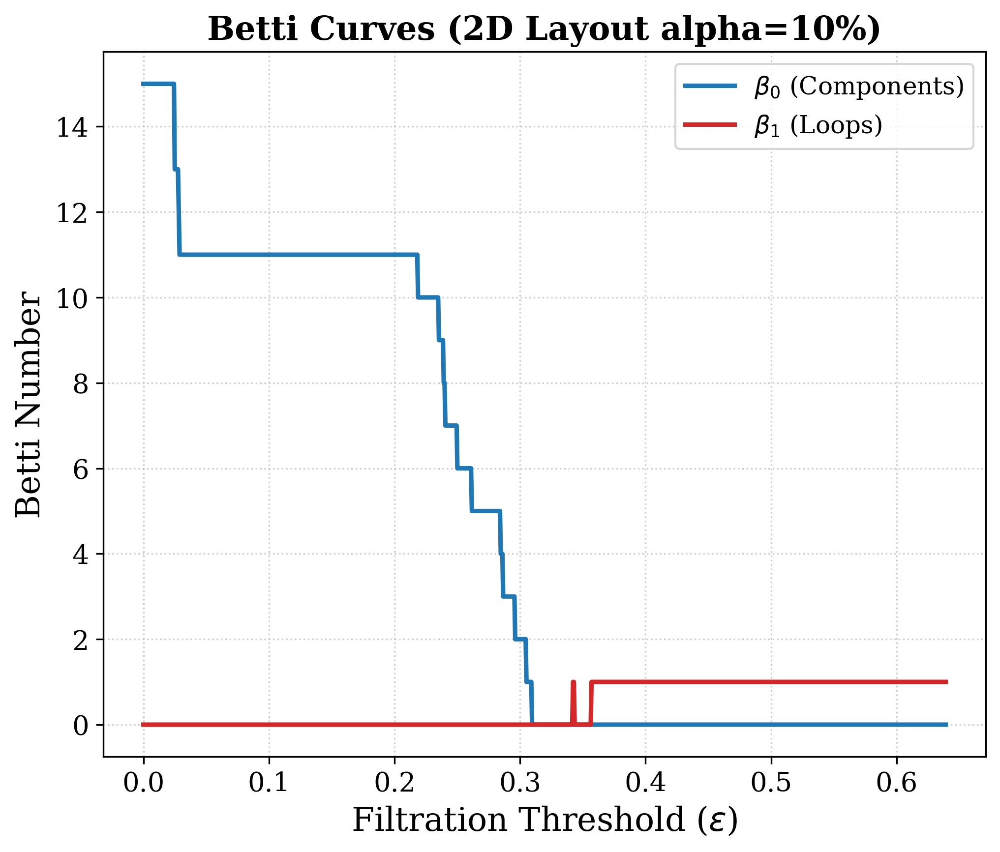

[2D Layout alpha=10%] Betti-1 value 1.0 has range [0.3422, 0.3429]
[2D Layout alpha=10%] Betti-1 value 1.0 has range [0.3570, 0.6391]


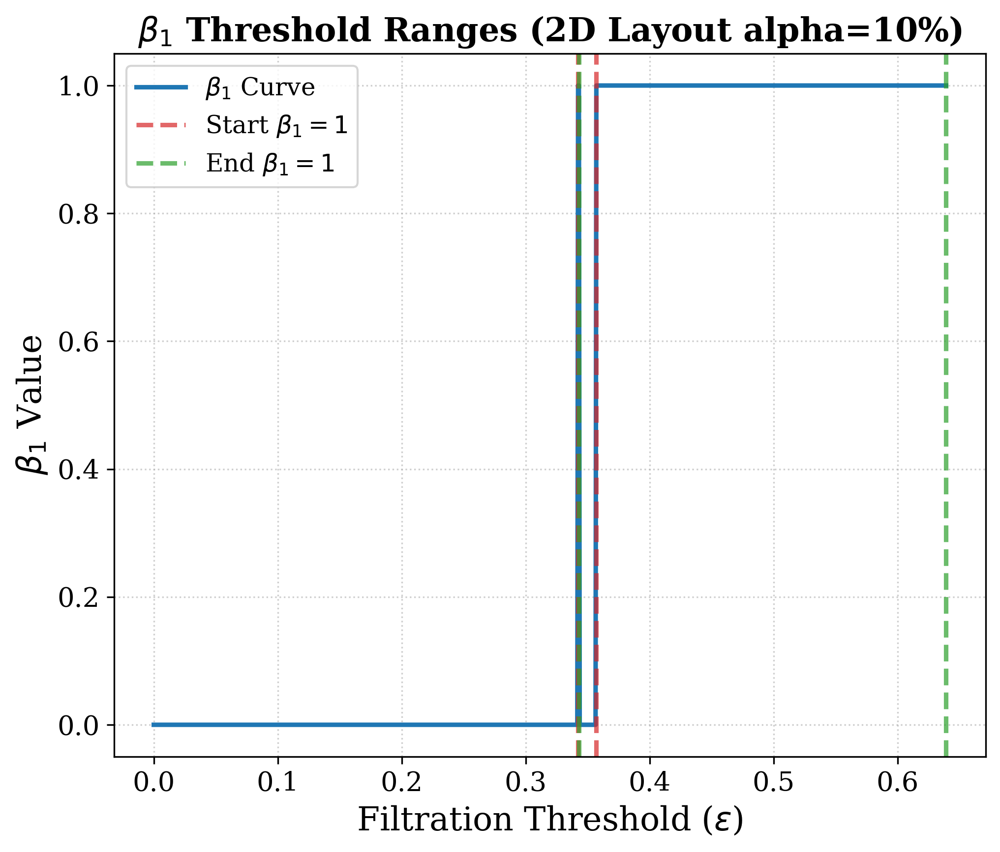

[2D Layout alpha=10%] Betti-1 value 1.0 total range: 0.0566

[2D Layout alpha=10%] Highest range Betti-1: 1.0 (total range = 0.0566)
[2D Layout alpha=10%] Raw midpoint epsilon threshold: 0.4907
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


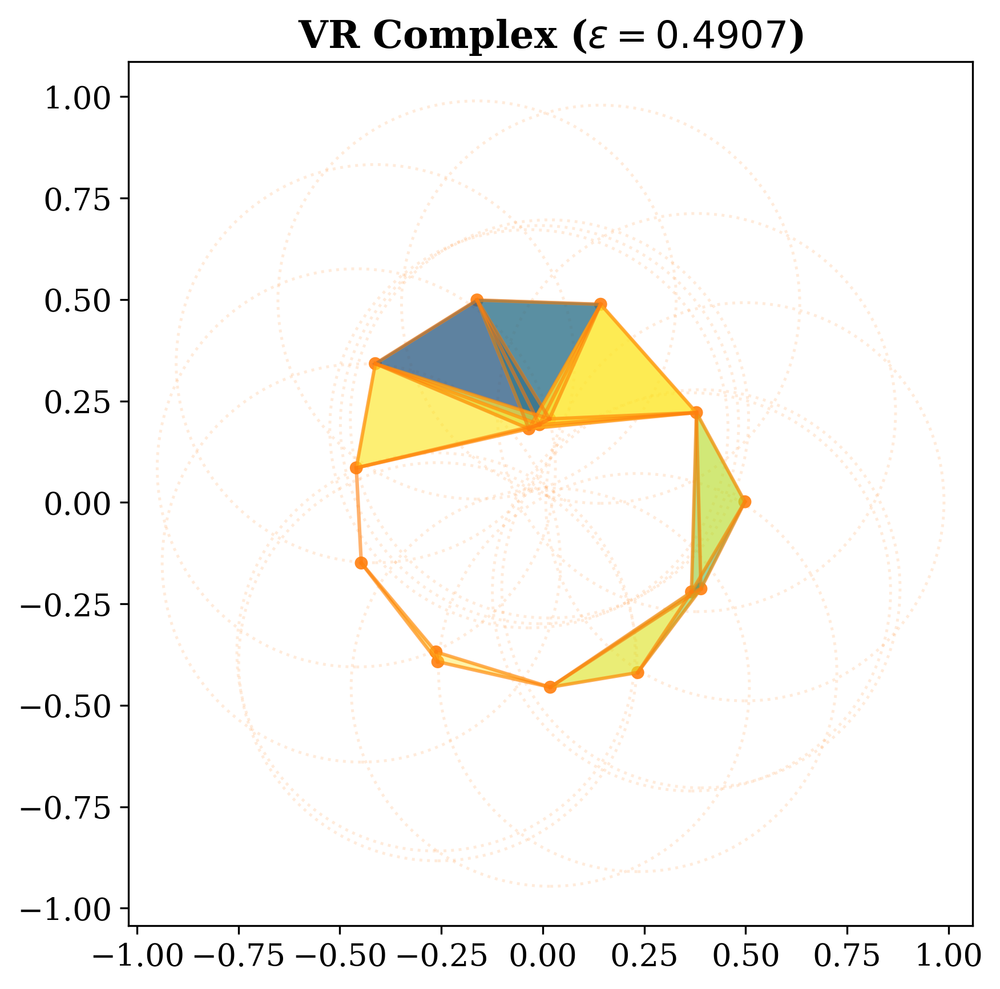


Processing Mapper graph for alpha = 15%
For alpha = 15%, N = 4


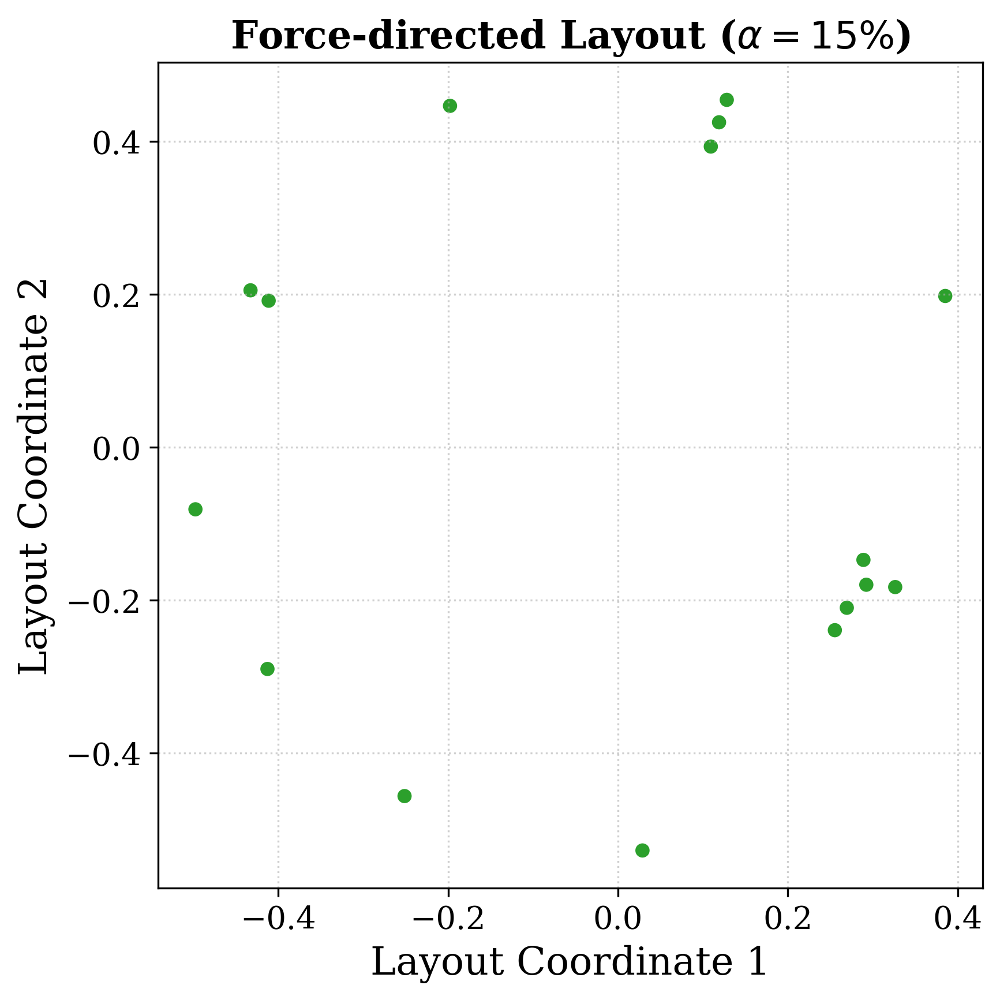


--- Topological Analysis on 2D Layout (alpha = 15%) ---


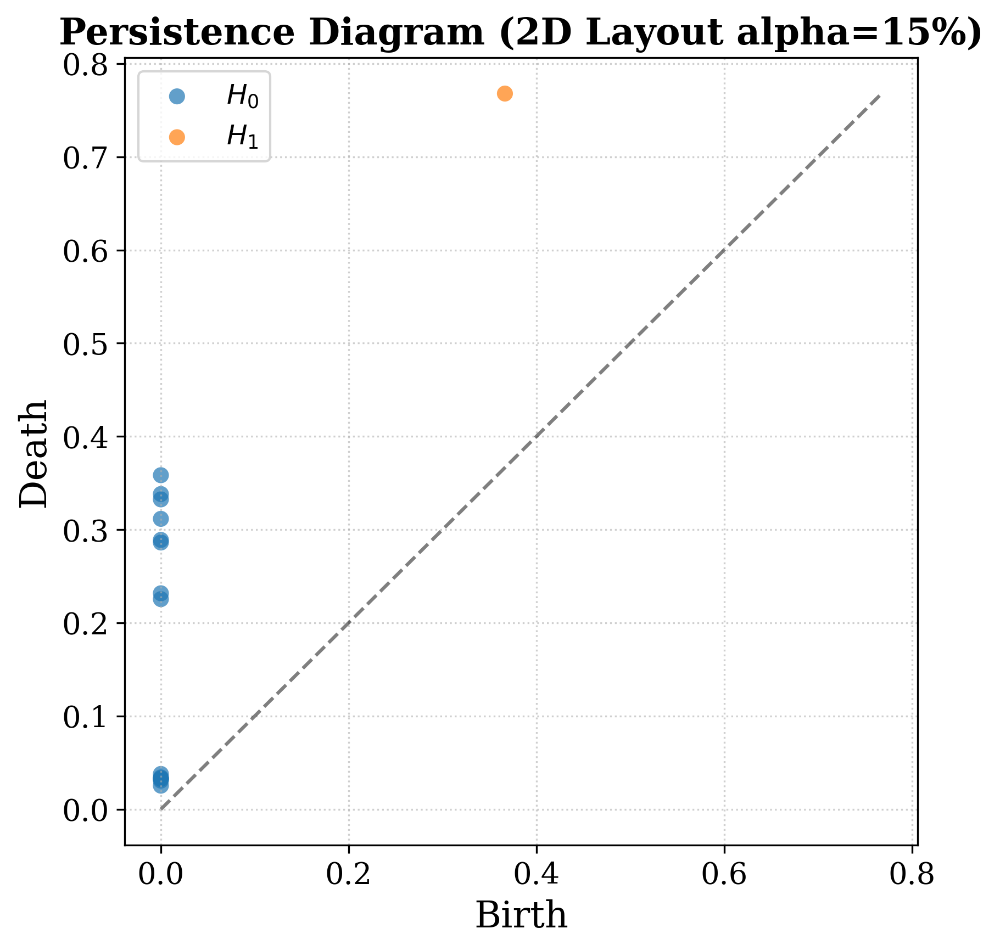

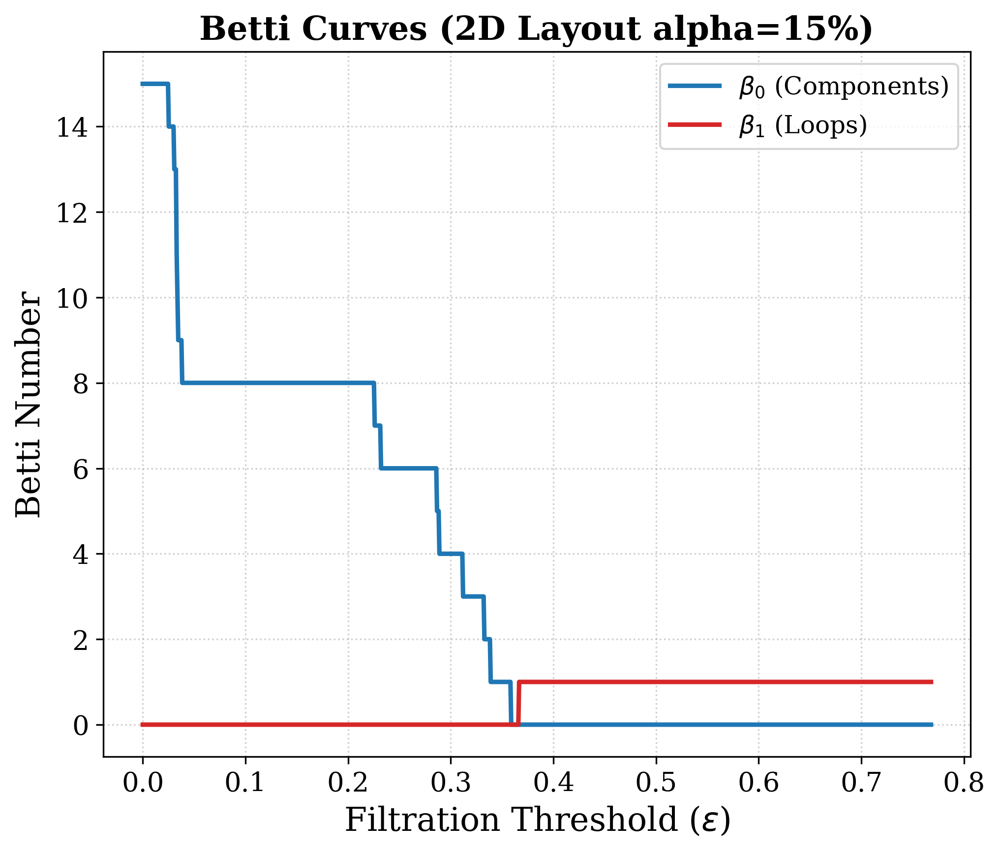

[2D Layout alpha=15%] Betti-1 value 1.0 has range [0.3666, 0.7678]


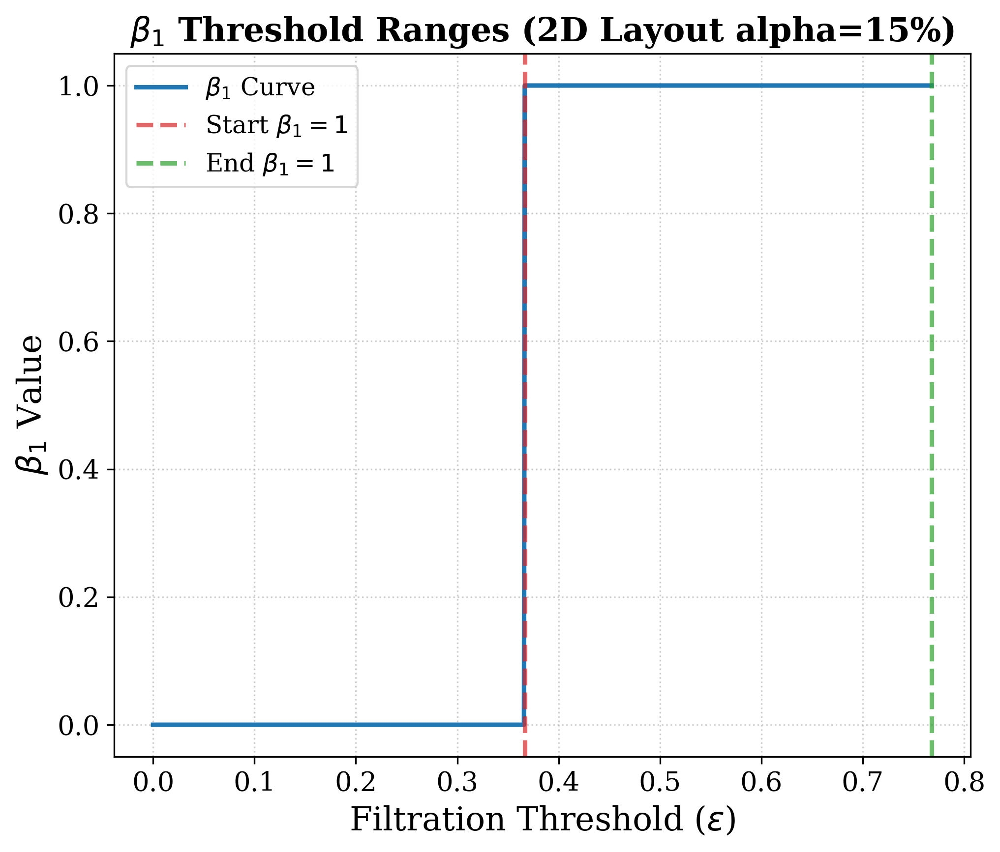

[2D Layout alpha=15%] Betti-1 value 1.0 total range: 0.0802

[2D Layout alpha=15%] Highest range Betti-1: 1.0 (total range = 0.0802)
[2D Layout alpha=15%] Raw midpoint epsilon threshold: 0.5672
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


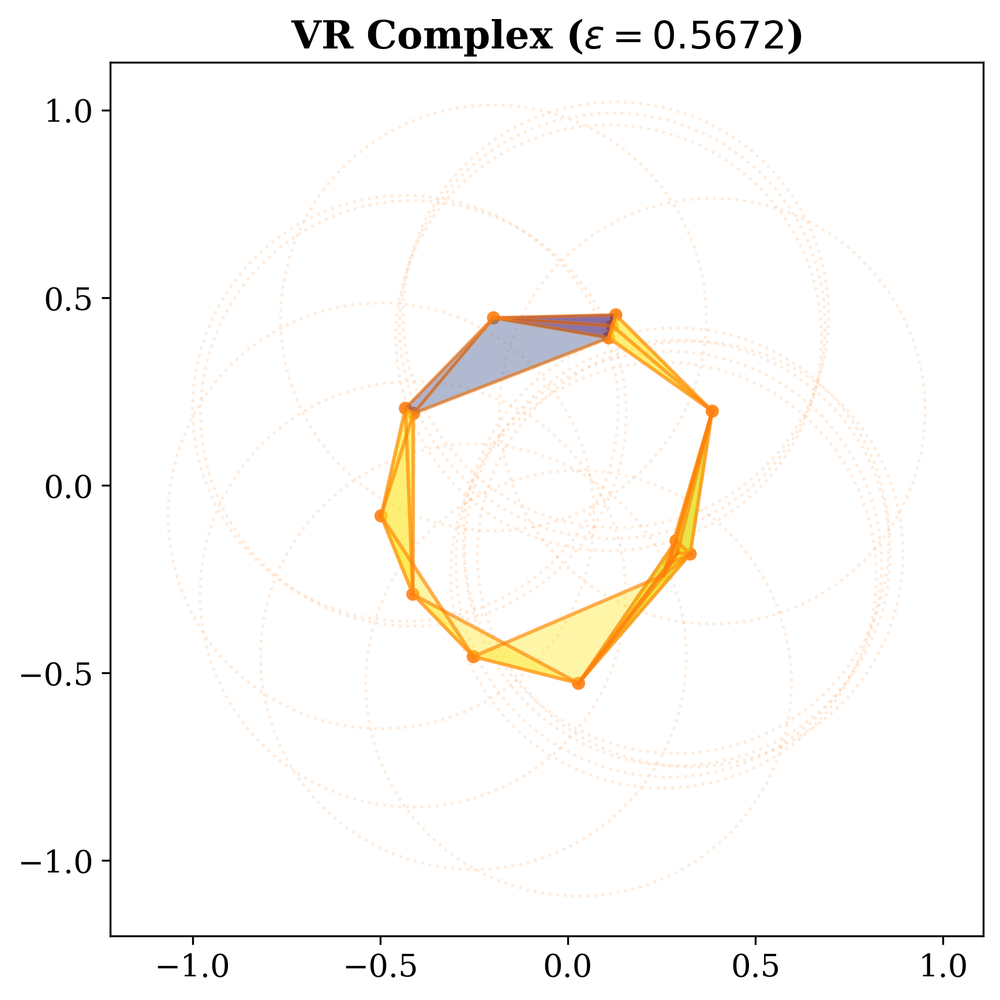


Processing Mapper graph for alpha = 20%
For alpha = 20%, N = 4


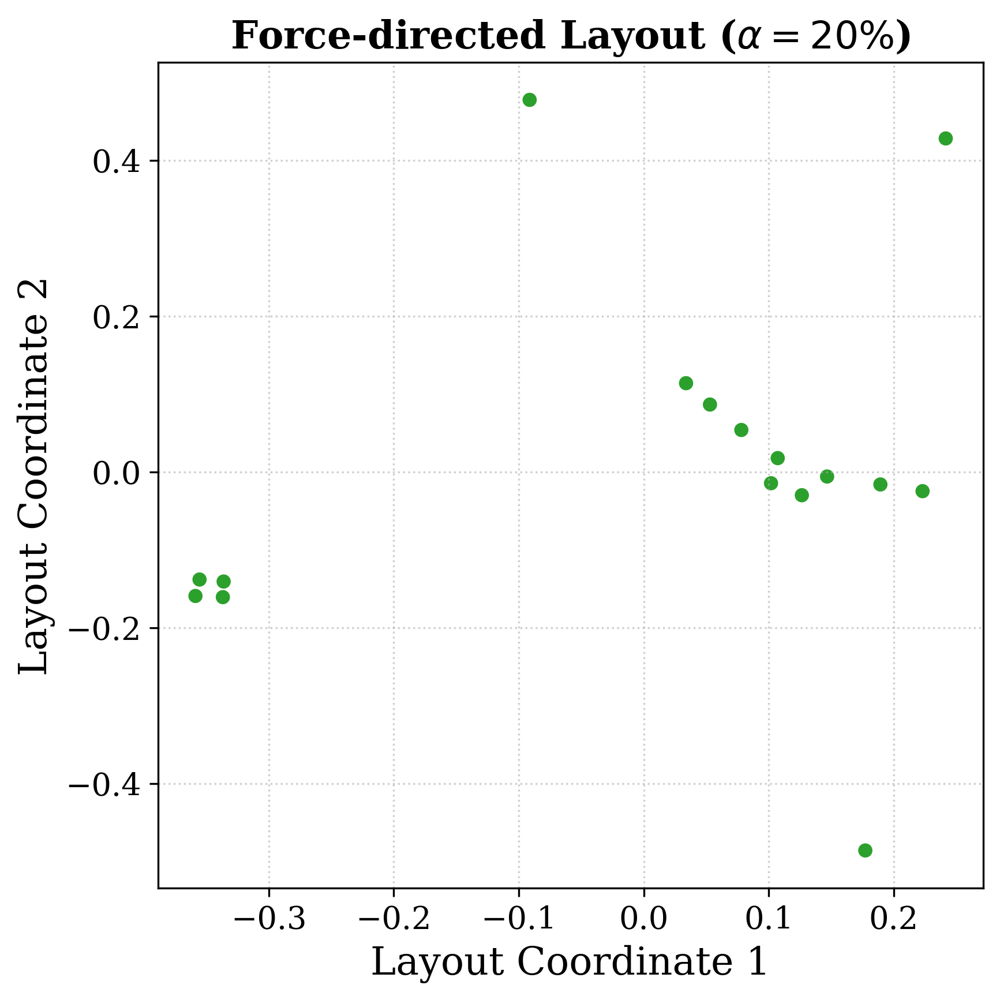


--- Topological Analysis on 2D Layout (alpha = 20%) ---


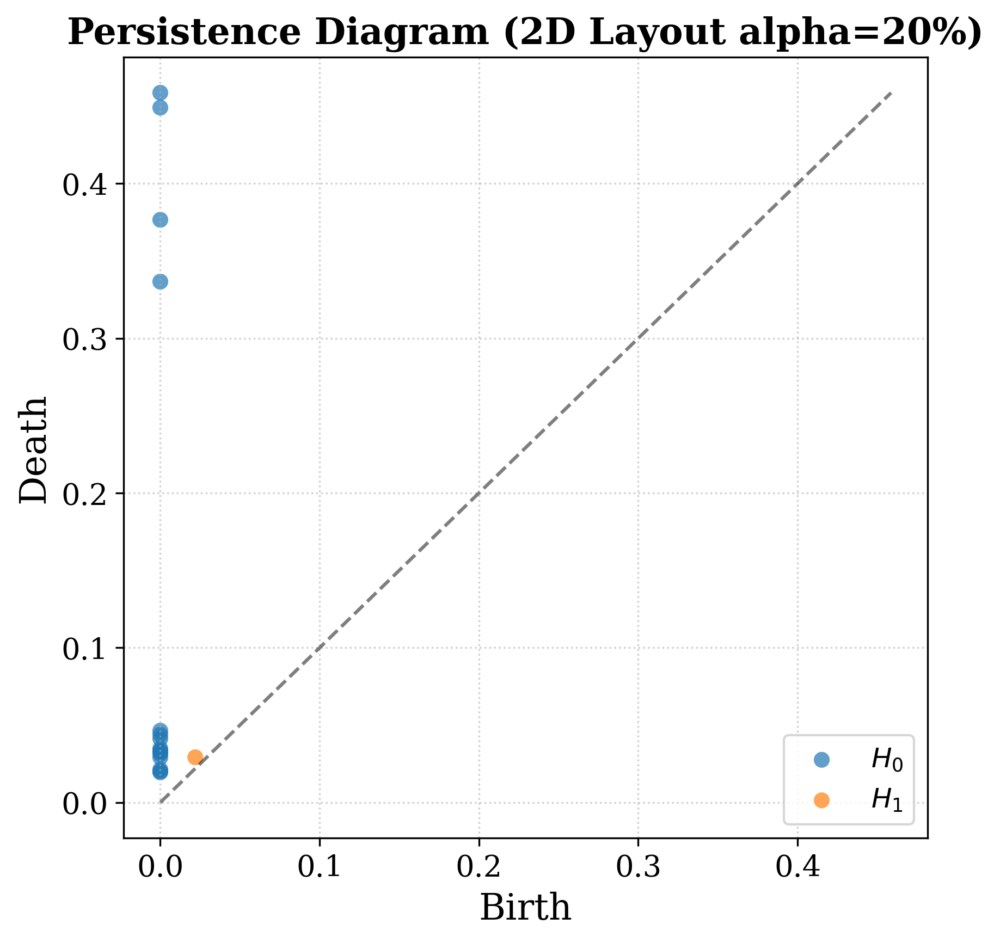

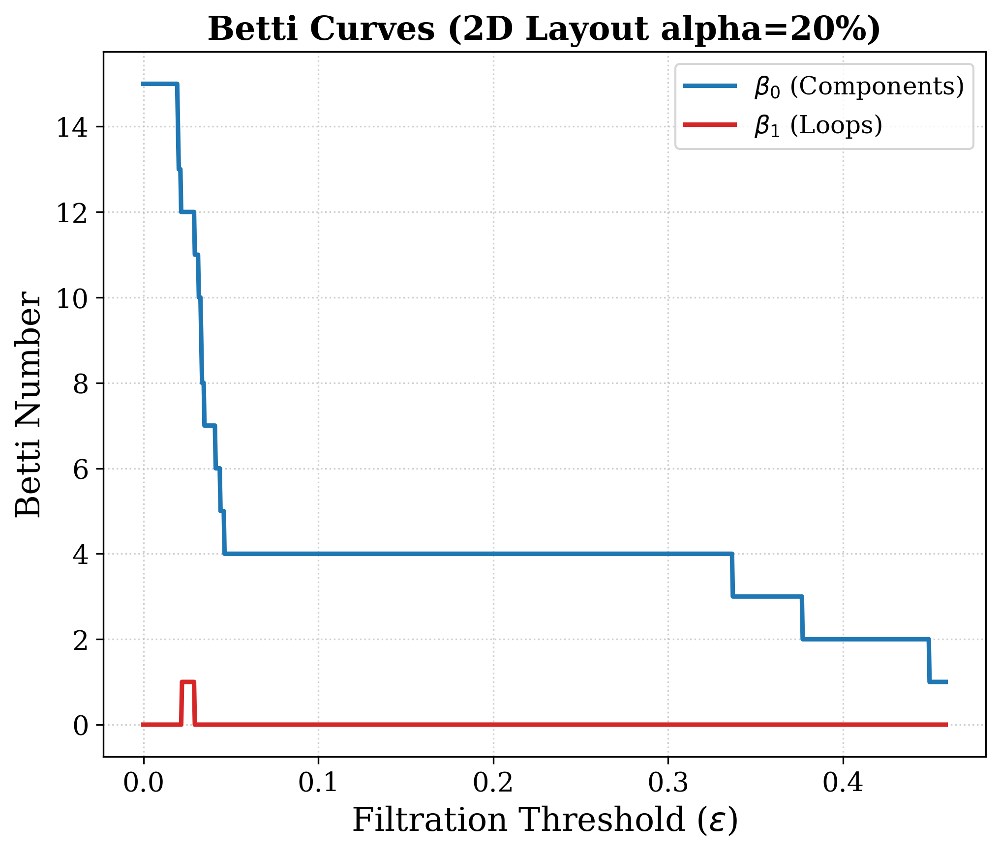

[2D Layout alpha=20%] Betti-1 value 1.0 has range [0.0220, 0.0289]


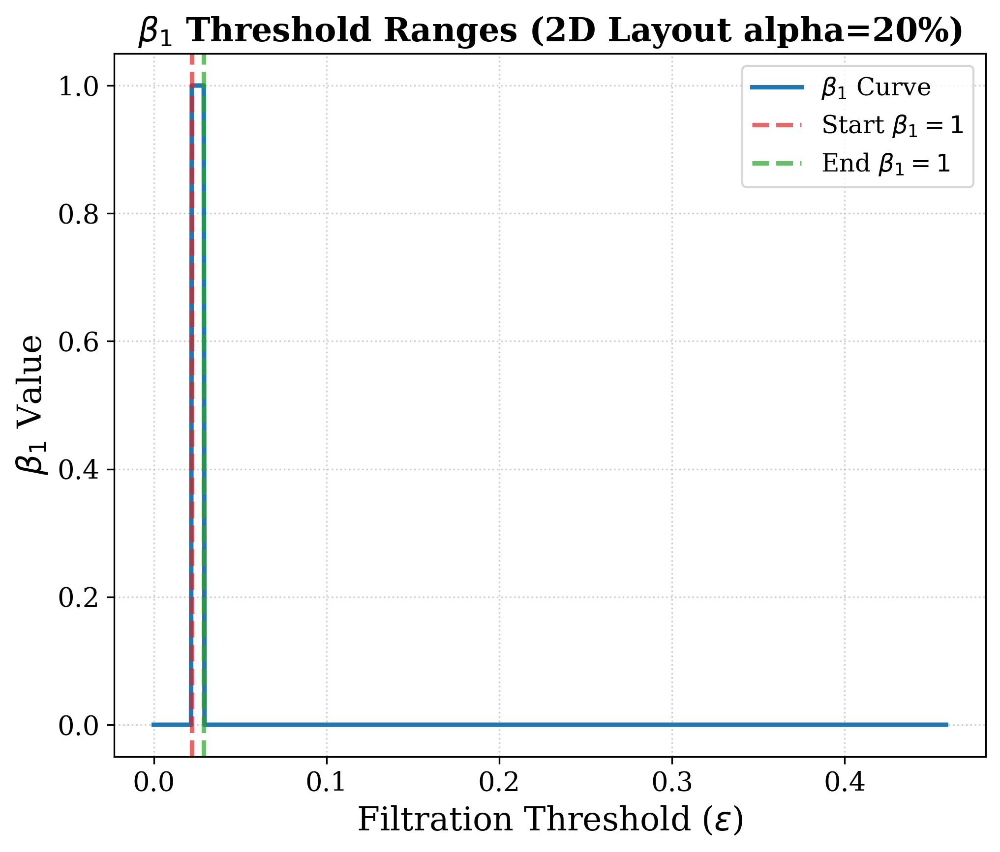

[2D Layout alpha=20%] Betti-1 value 1.0 total range: 0.0014

[2D Layout alpha=20%] Highest range Betti-1: 1.0 (total range = 0.0014)
[2D Layout alpha=20%] Raw midpoint epsilon threshold: 0.0255
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


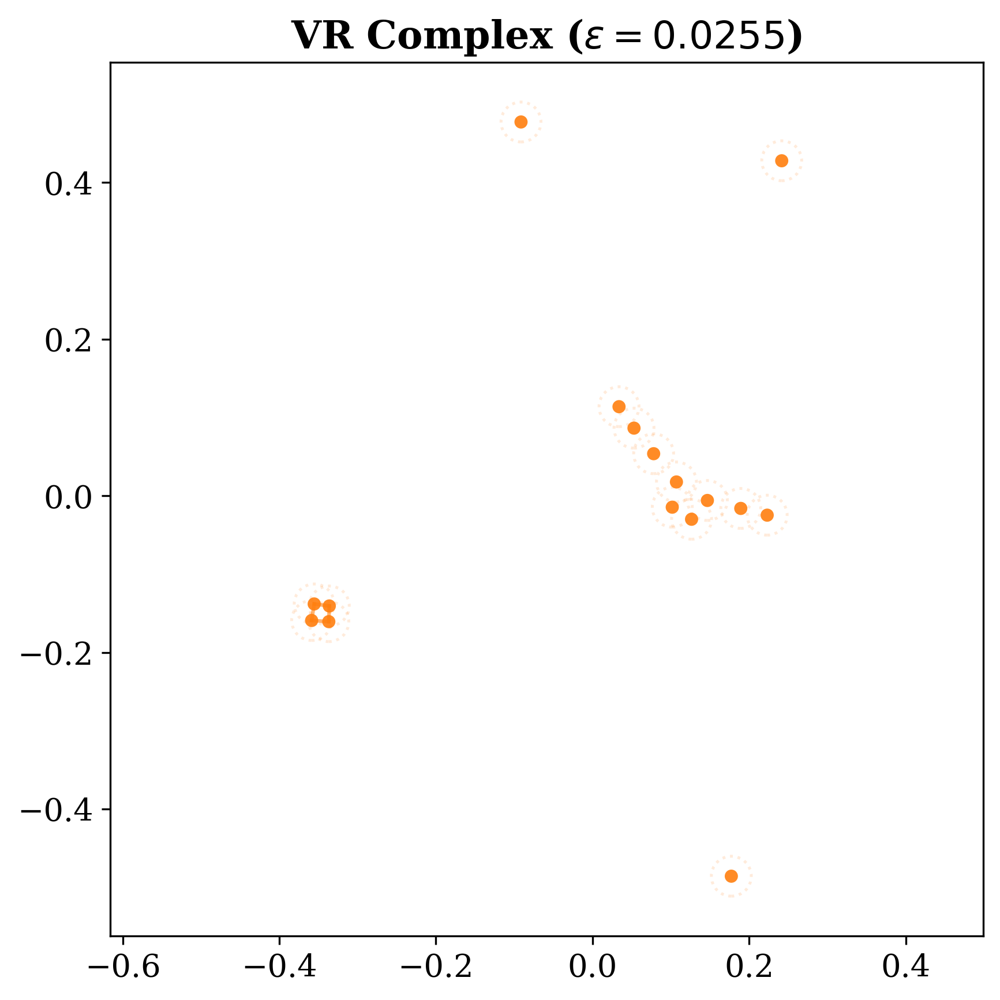


Processing Mapper graph for alpha = 25%
For alpha = 25%, N = 4


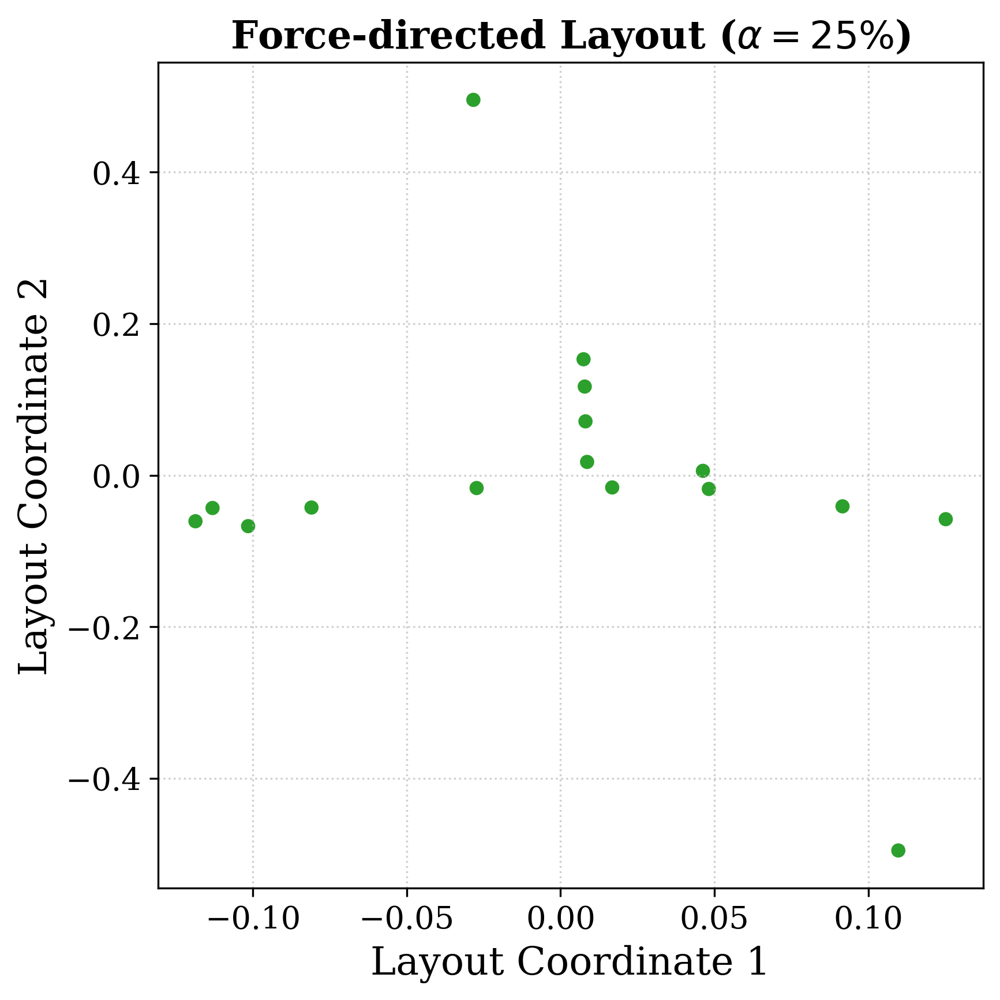


--- Topological Analysis on 2D Layout (alpha = 25%) ---


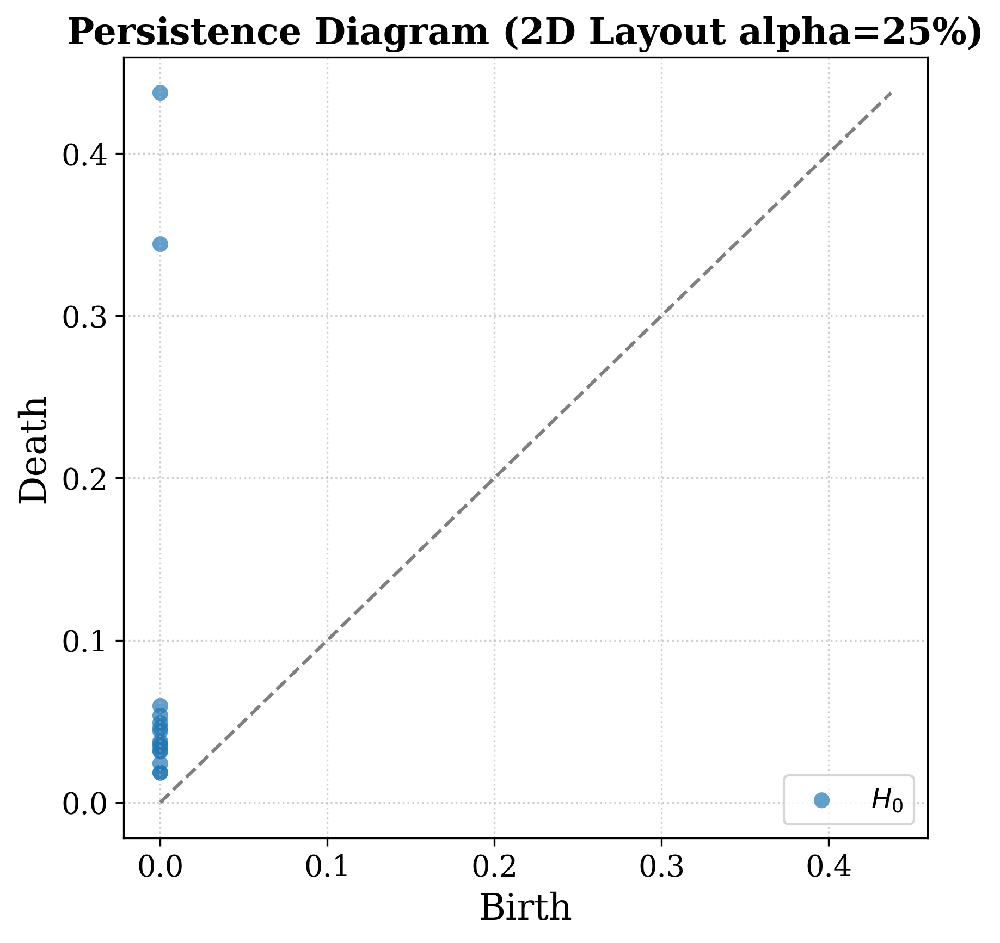

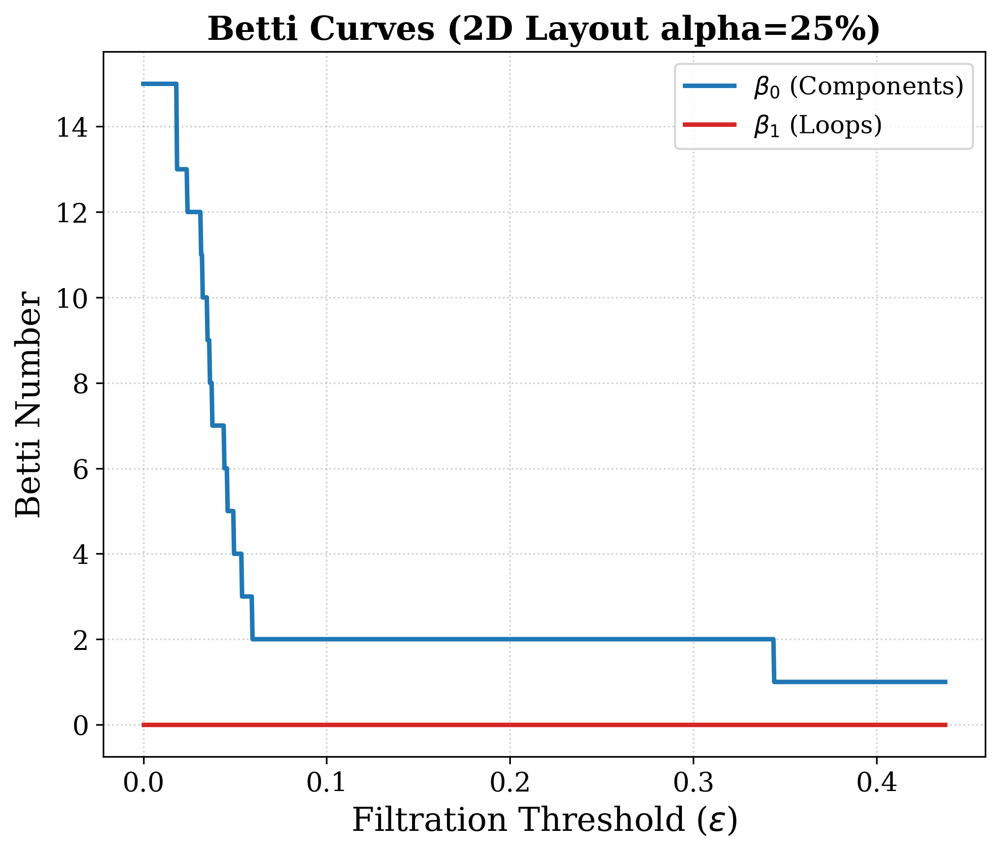

[2D Layout alpha=25%] No non-zero Betti-1 loops detected.
No valid Betti-1 loops found on 2D layout.

Processing Mapper graph for alpha = 30%
For alpha = 30%, N = 5


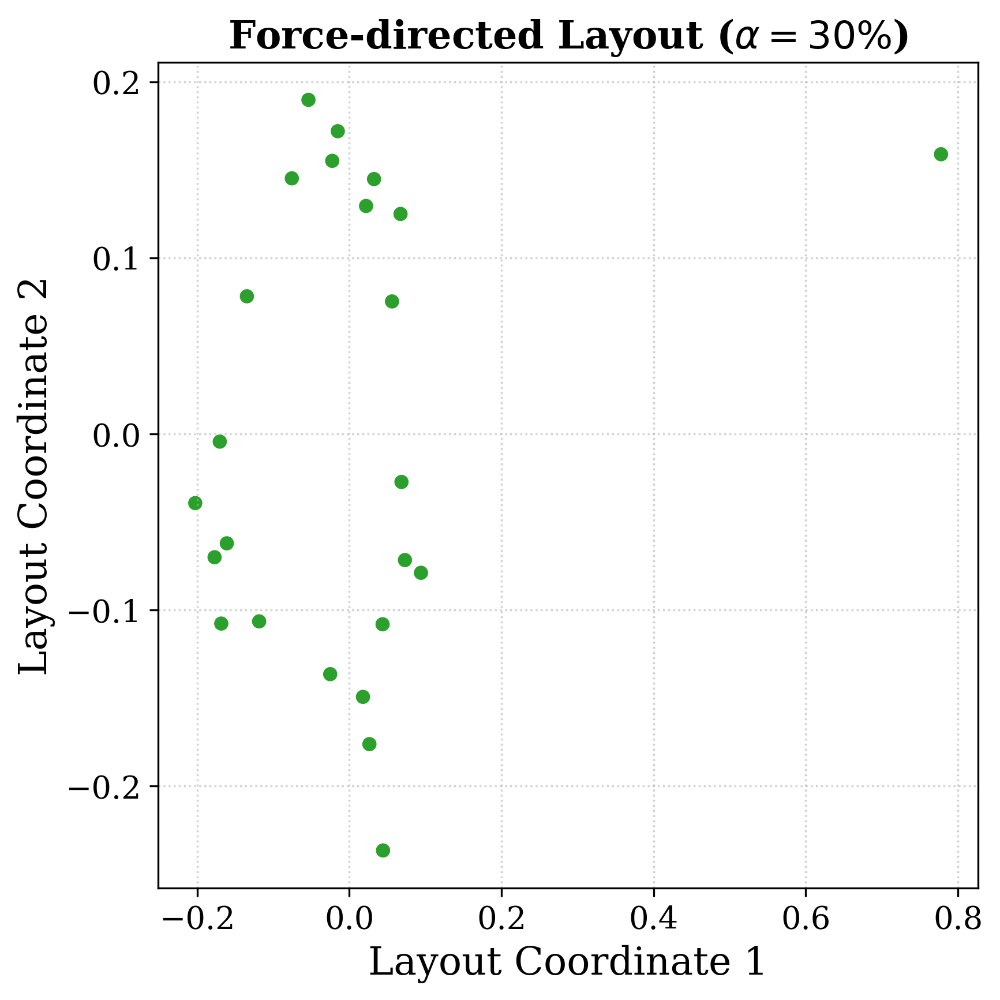


--- Topological Analysis on 2D Layout (alpha = 30%) ---


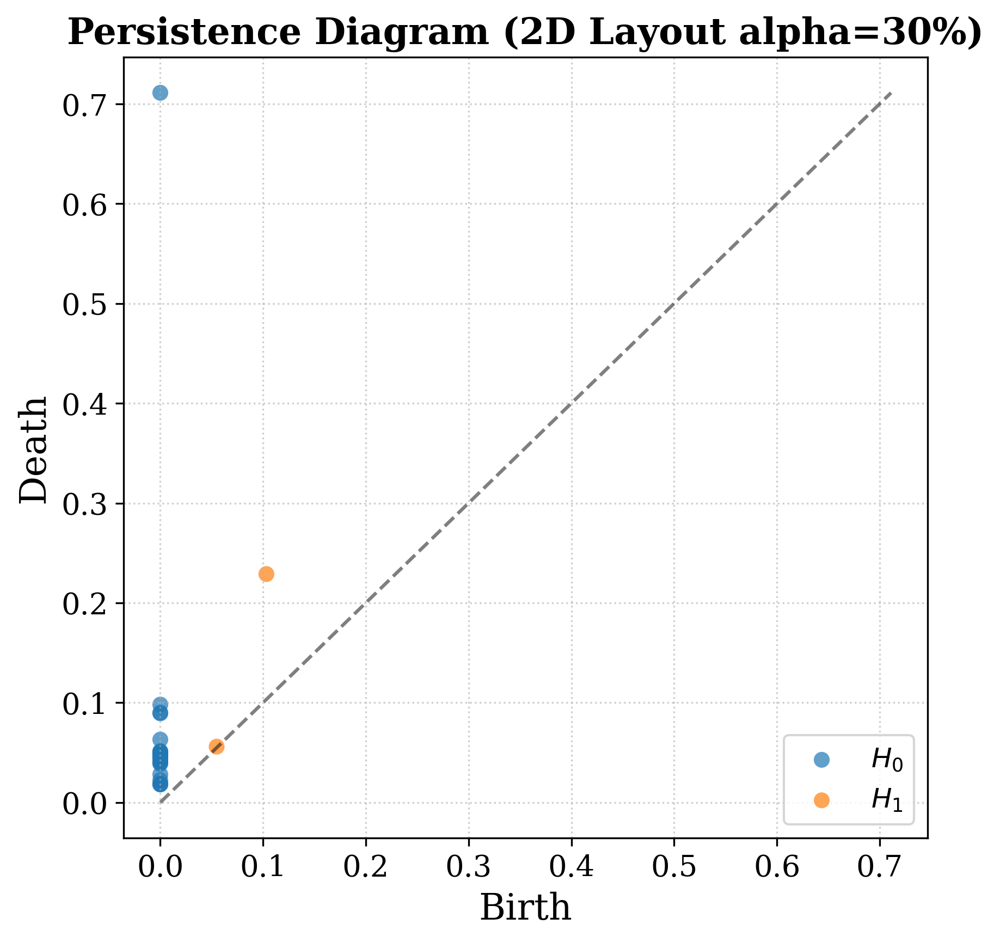

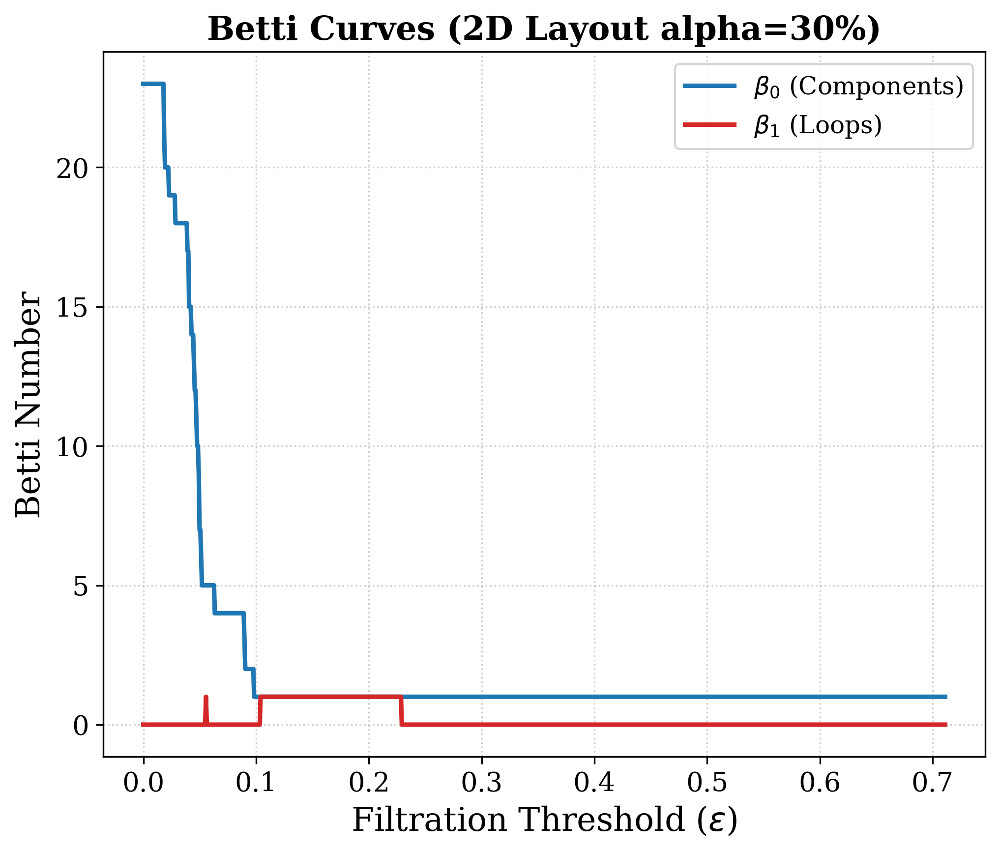

[2D Layout alpha=30%] Betti-1 value 1.0 has range [0.0555, 0.0555]
[2D Layout alpha=30%] Betti-1 value 1.0 has range [0.1039, 0.2285]


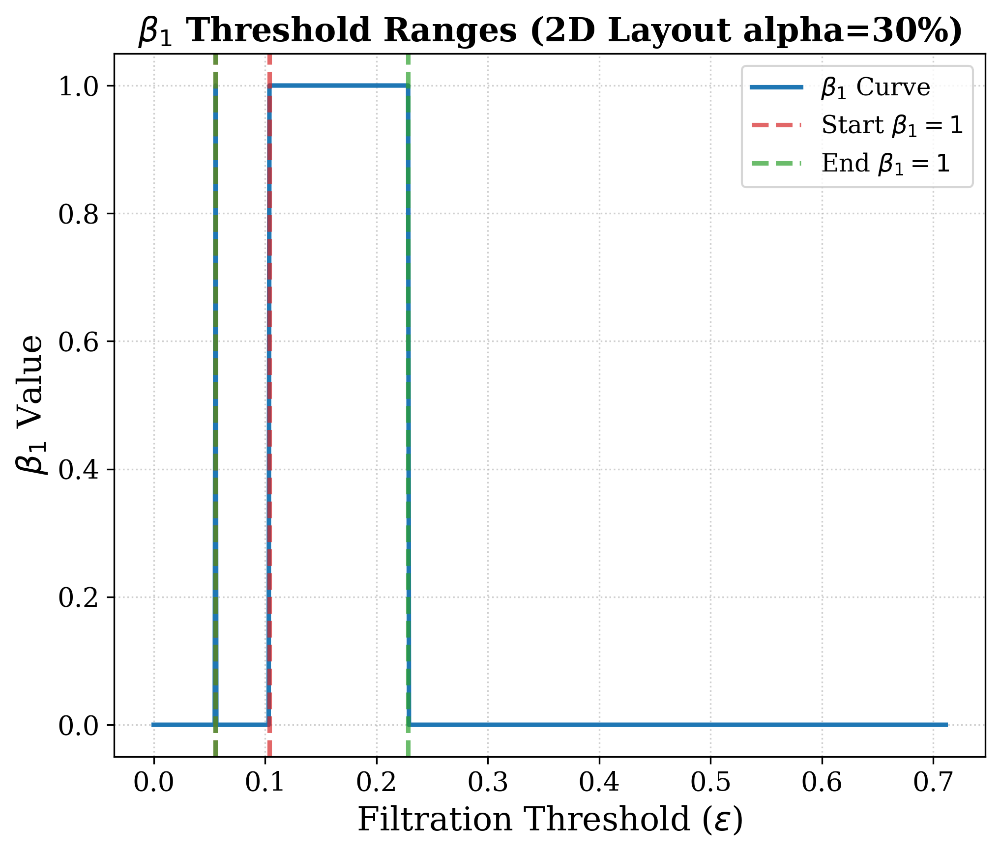

[2D Layout alpha=30%] Betti-1 value 1.0 total range: 0.0249

[2D Layout alpha=30%] Highest range Betti-1: 1.0 (total range = 0.0249)
[2D Layout alpha=30%] Raw midpoint epsilon threshold: 0.1420
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


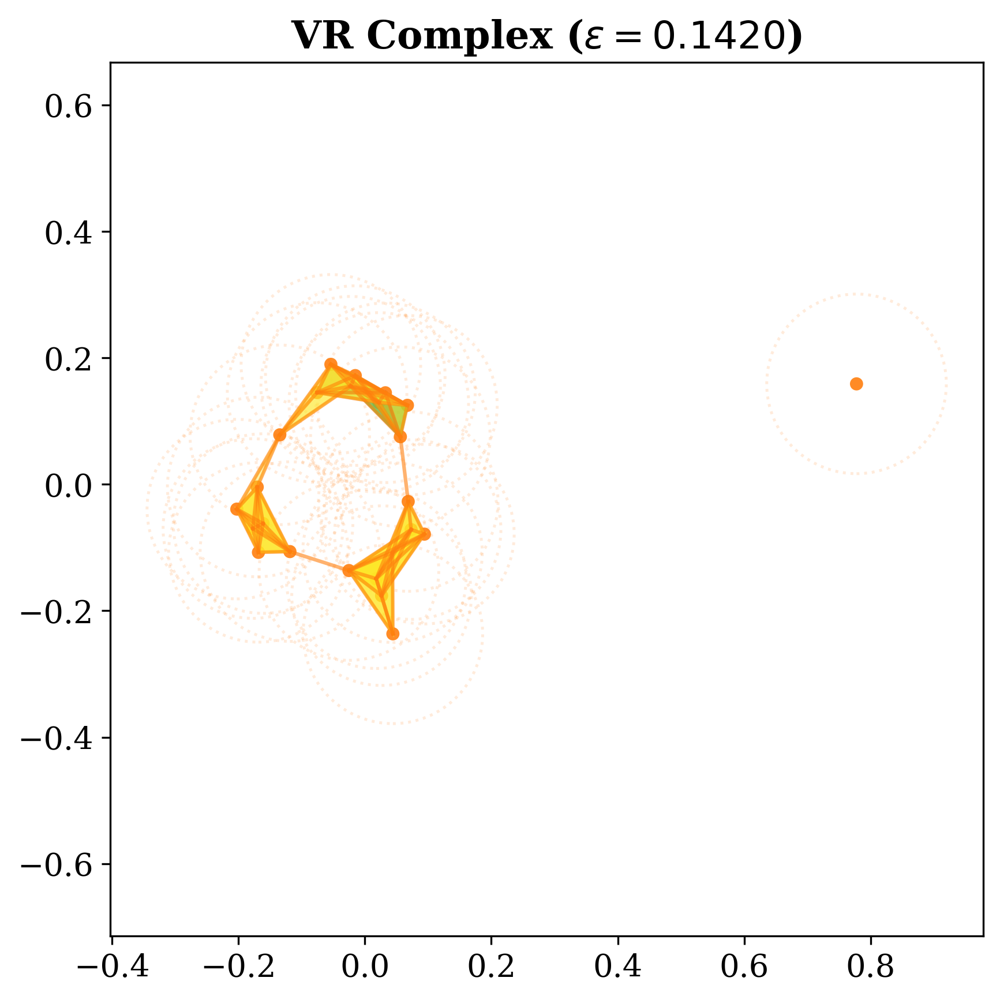


Processing Mapper graph for alpha = 35%
For alpha = 35%, N = 5


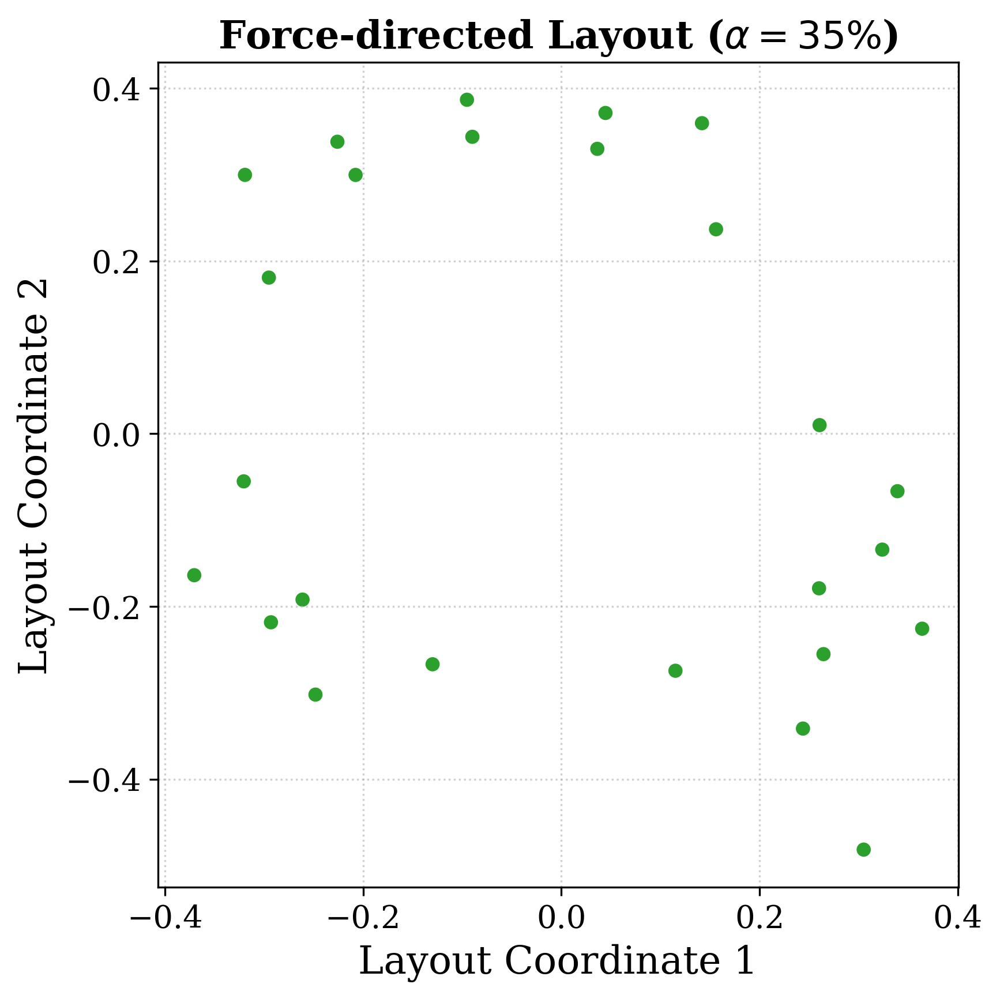


--- Topological Analysis on 2D Layout (alpha = 35%) ---


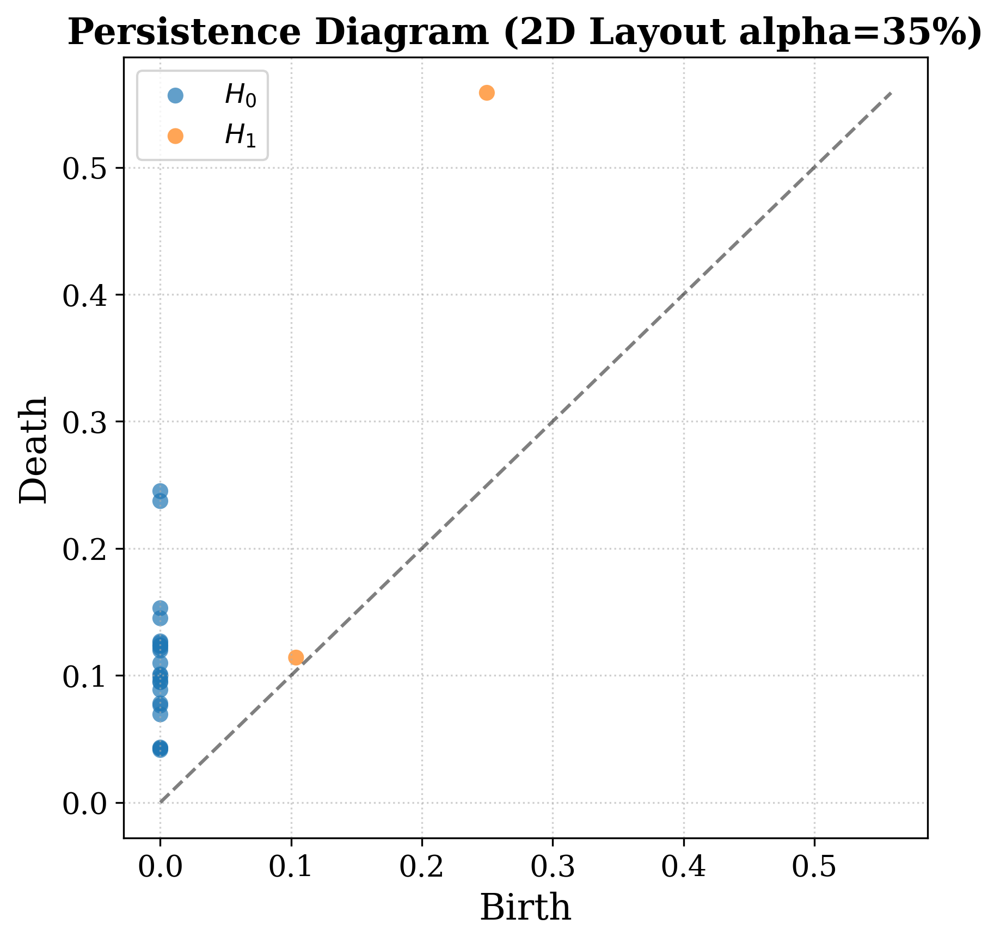

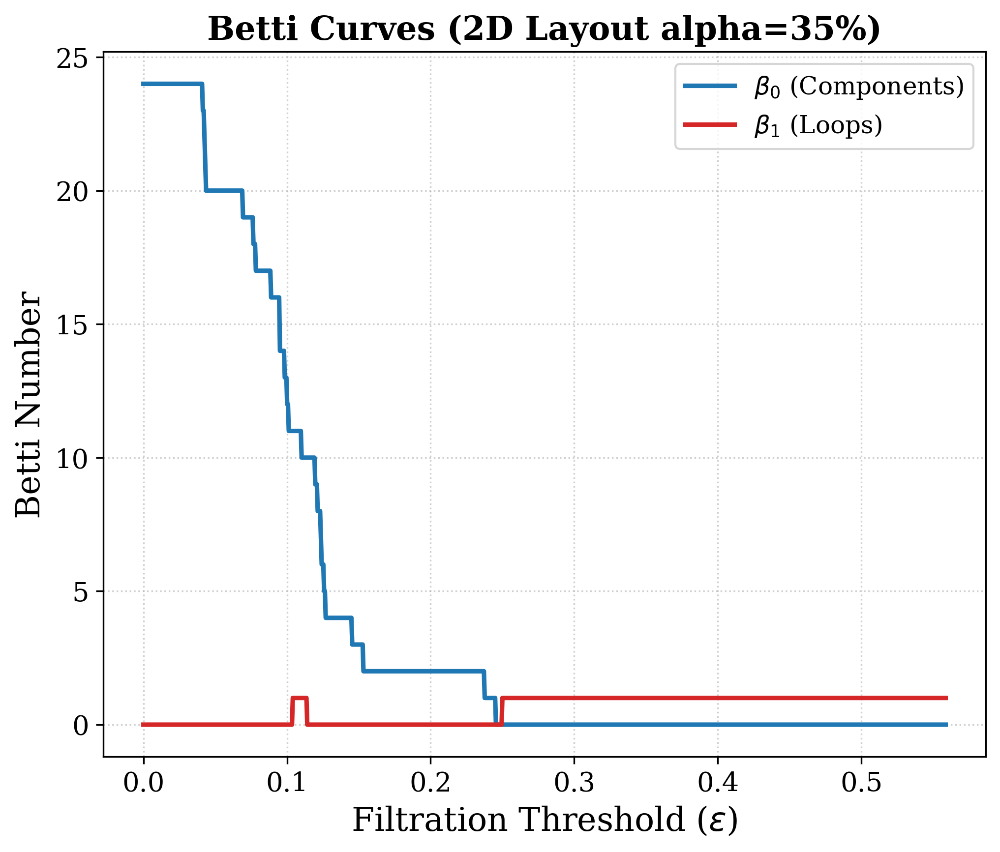

[2D Layout alpha=35%] Betti-1 value 1.0 has range [0.1040, 0.1135]
[2D Layout alpha=35%] Betti-1 value 1.0 has range [0.2500, 0.5587]


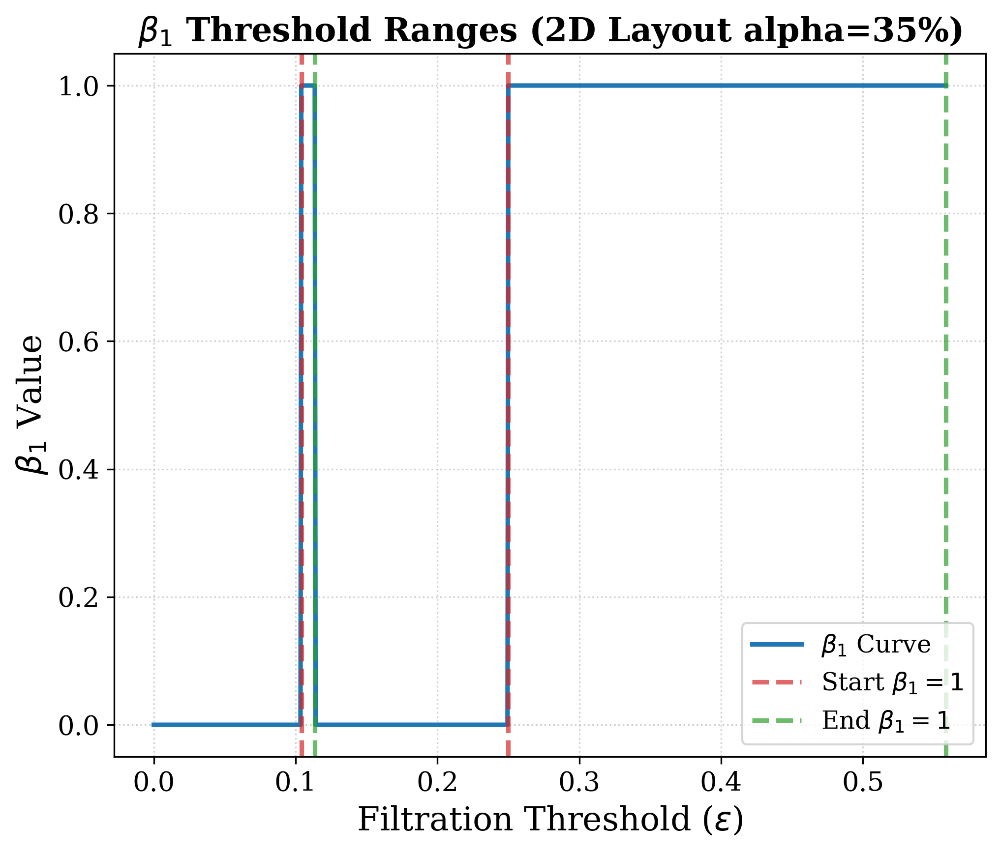

[2D Layout alpha=35%] Betti-1 value 1.0 total range: 0.0636

[2D Layout alpha=35%] Highest range Betti-1: 1.0 (total range = 0.0636)
[2D Layout alpha=35%] Raw midpoint epsilon threshold: 0.3314
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


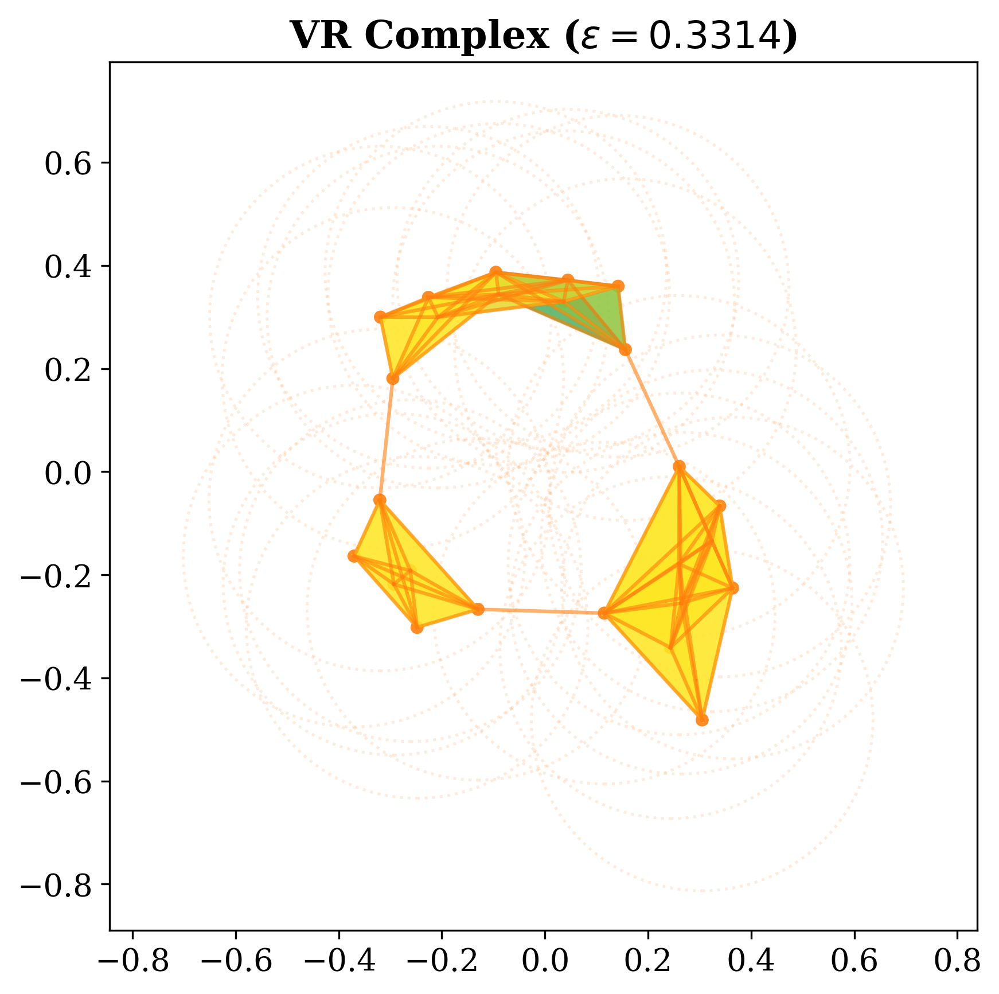


Processing Mapper graph for alpha = 40%
For alpha = 40%, N = 5


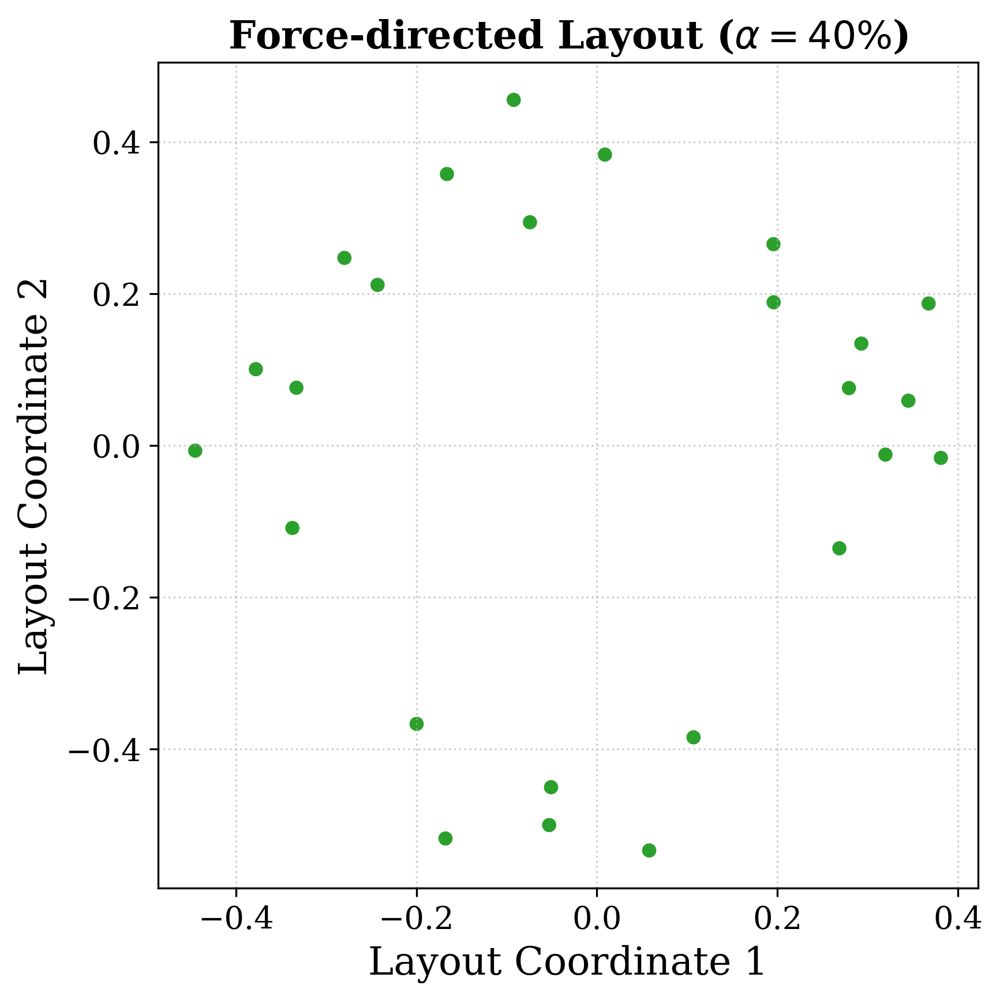


--- Topological Analysis on 2D Layout (alpha = 40%) ---


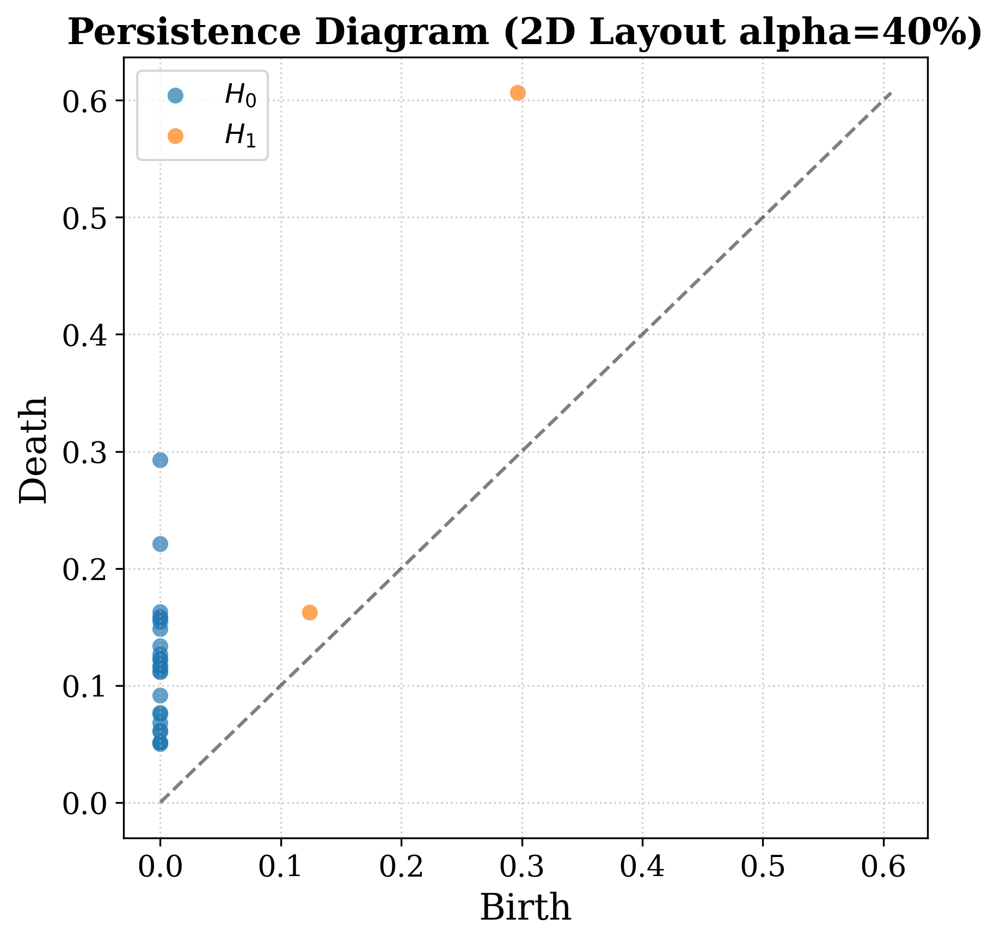

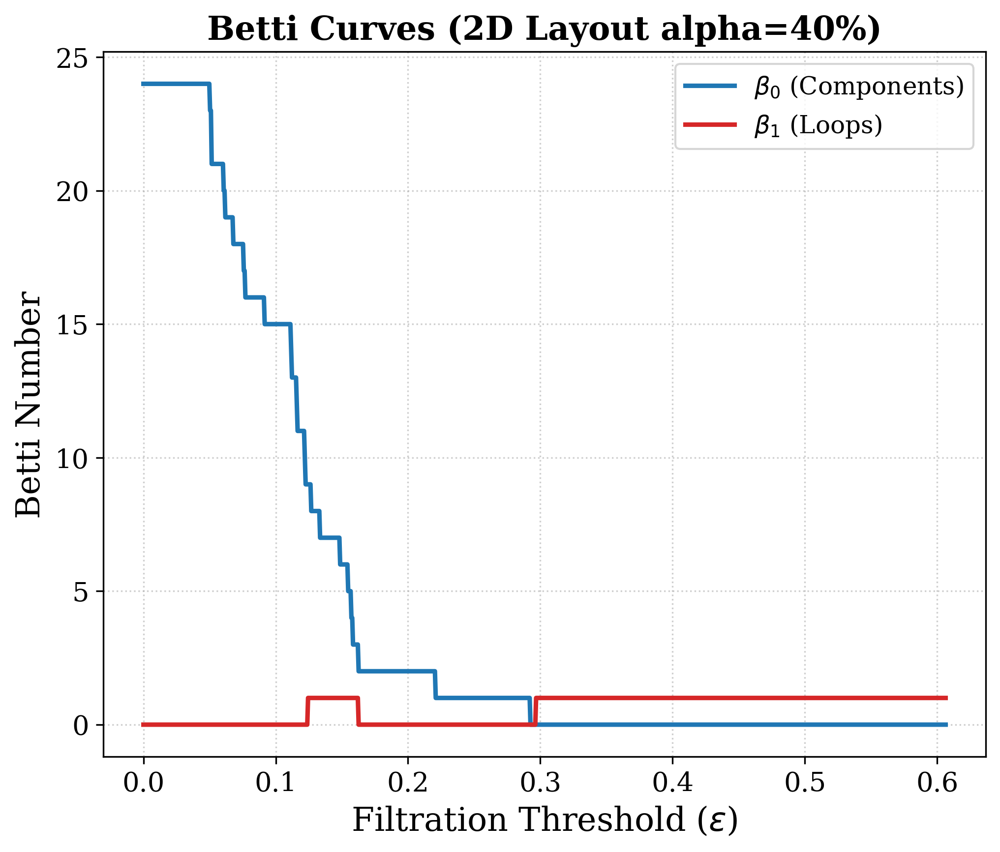

[2D Layout alpha=40%] Betti-1 value 1.0 has range [0.1244, 0.1621]
[2D Layout alpha=40%] Betti-1 value 1.0 has range [0.2969, 0.6065]


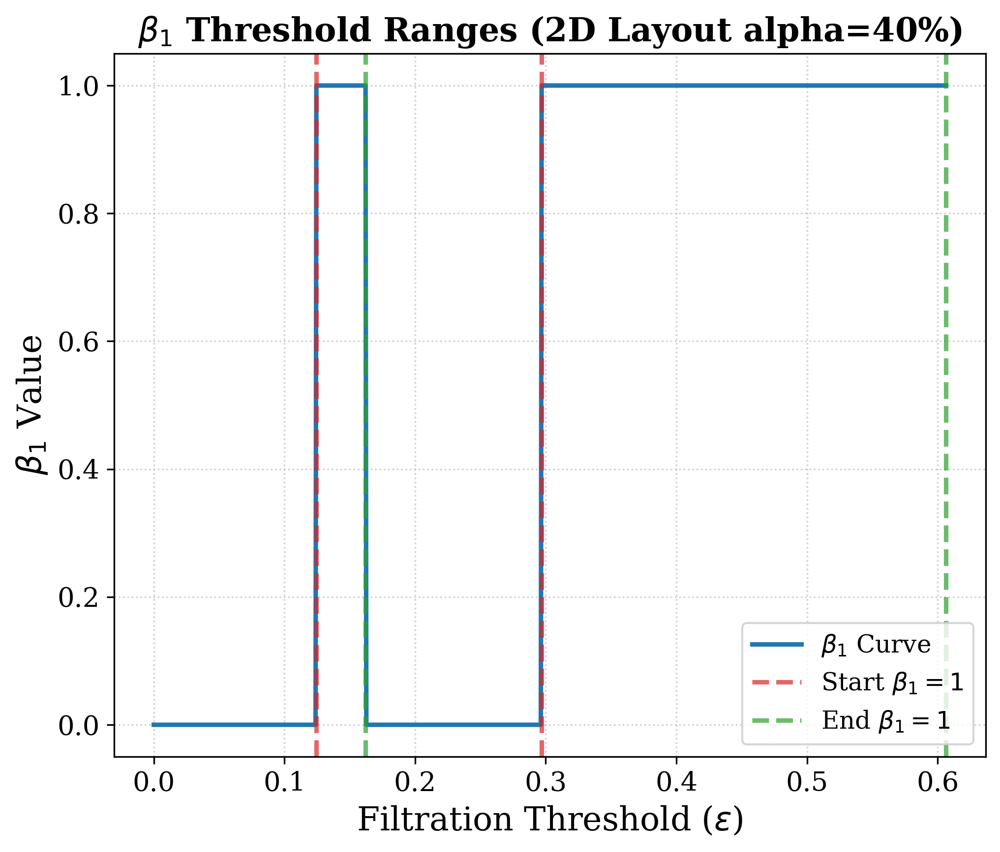

[2D Layout alpha=40%] Betti-1 value 1.0 total range: 0.0694

[2D Layout alpha=40%] Highest range Betti-1: 1.0 (total range = 0.0694)
[2D Layout alpha=40%] Raw midpoint epsilon threshold: 0.3655
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


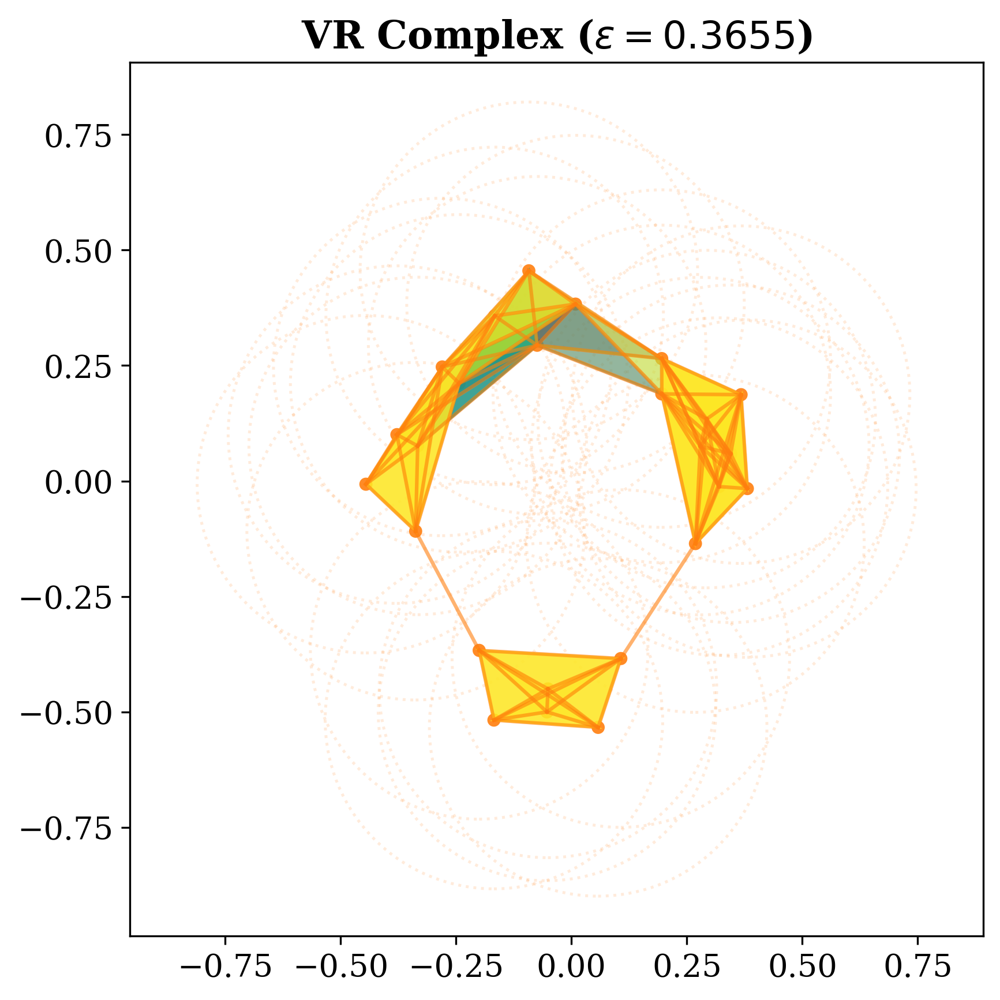


Processing Mapper graph for alpha = 45%
For alpha = 45%, N = 6


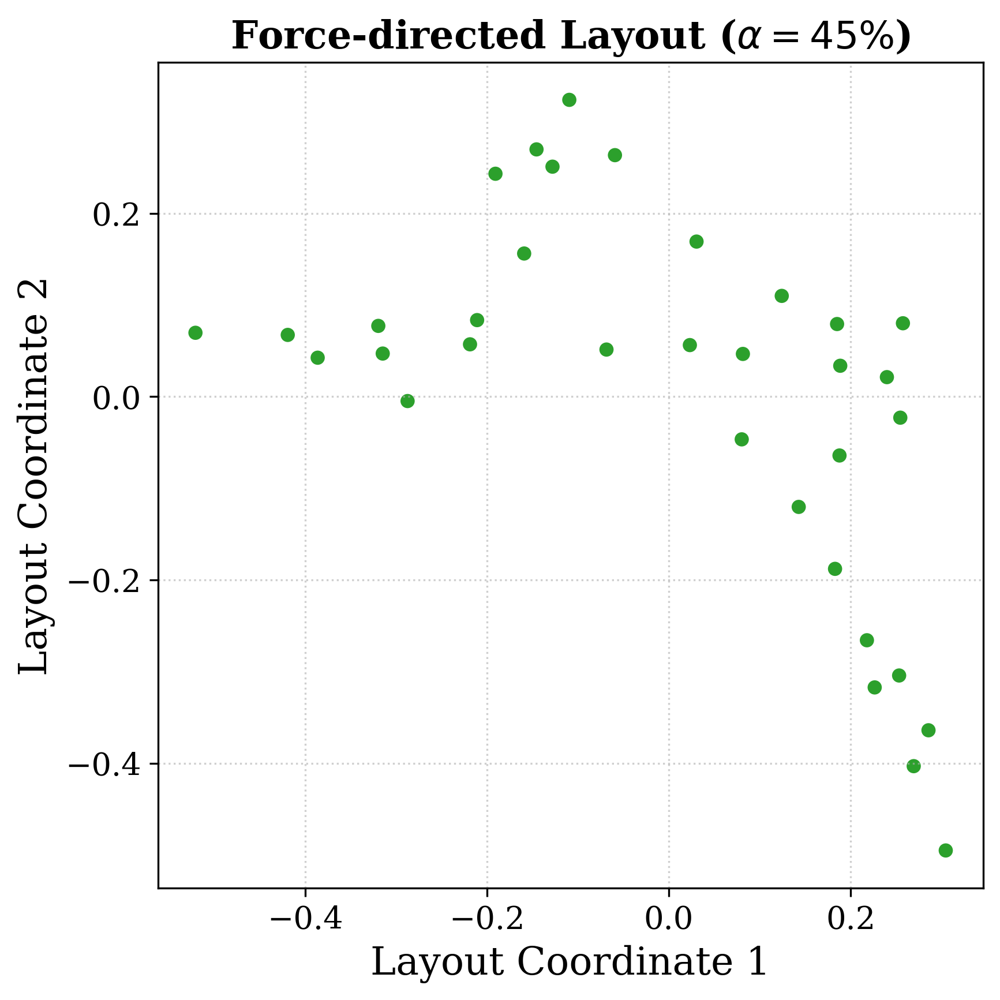


--- Topological Analysis on 2D Layout (alpha = 45%) ---


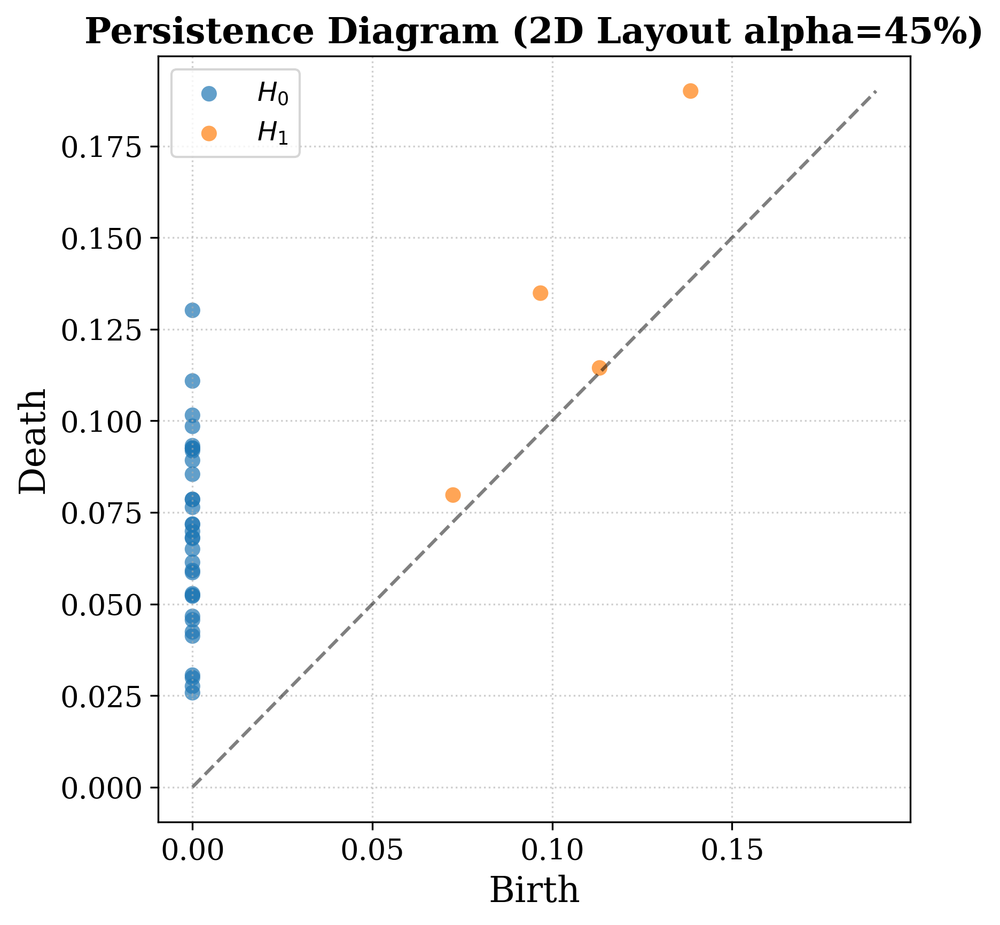

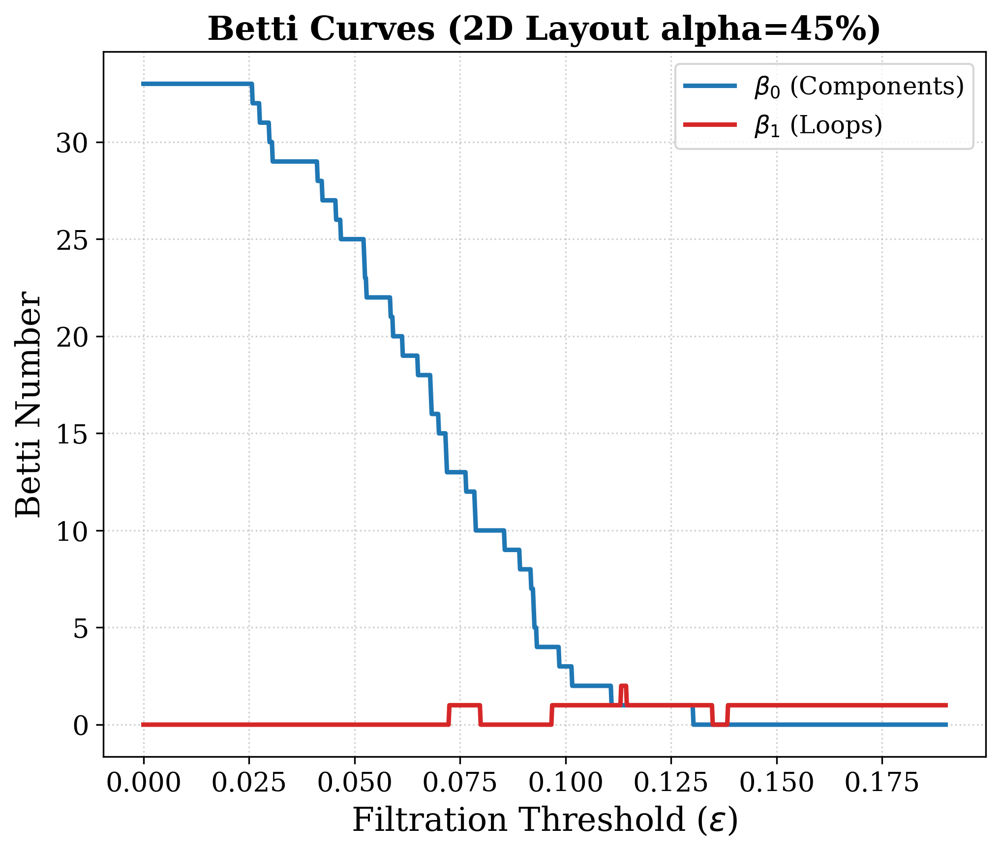

[2D Layout alpha=45%] Betti-1 value 2.0 has range [0.1132, 0.1143]
[2D Layout alpha=45%] Betti-1 value 1.0 has range [0.0725, 0.0797]
[2D Layout alpha=45%] Betti-1 value 1.0 has range [0.0968, 0.1130]
[2D Layout alpha=45%] Betti-1 value 1.0 has range [0.1145, 0.1347]
[2D Layout alpha=45%] Betti-1 value 1.0 has range [0.1385, 0.1900]


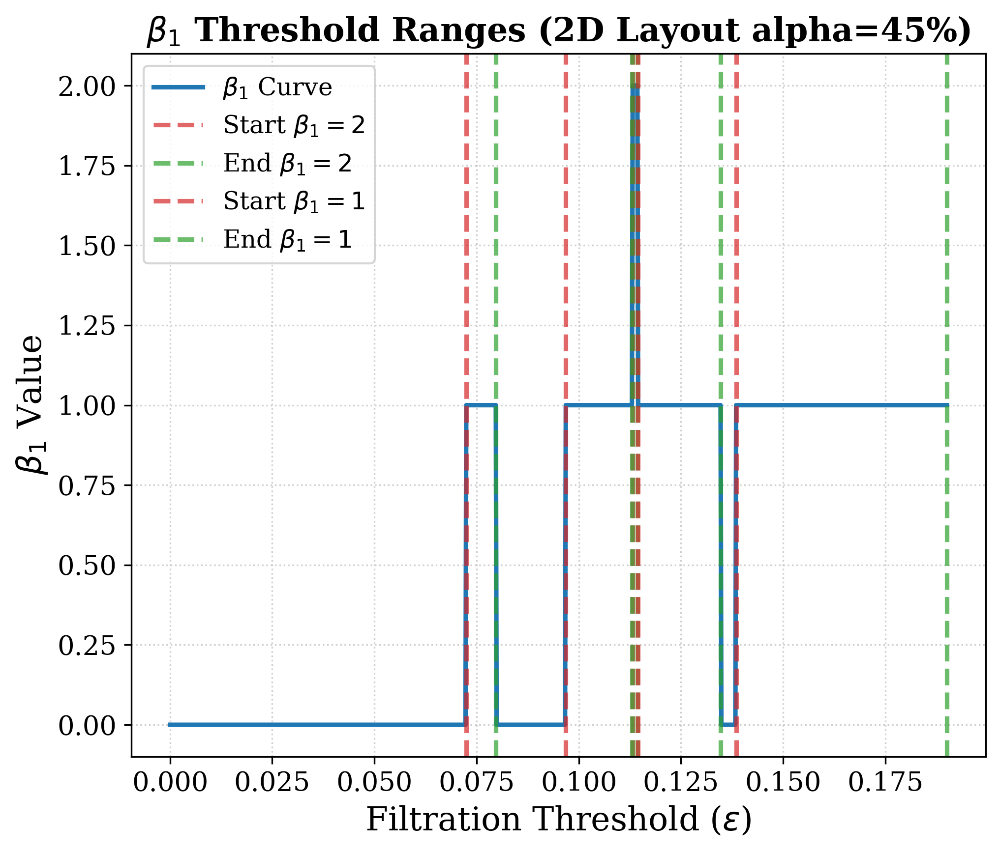

[2D Layout alpha=45%] Betti-1 value 2.0 total range: 0.0011
[2D Layout alpha=45%] Betti-1 value 1.0 total range: 0.0190

[2D Layout alpha=45%] Highest range Betti-1: 1.0 (total range = 0.0190)
[2D Layout alpha=45%] Raw midpoint epsilon threshold: 0.1313
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


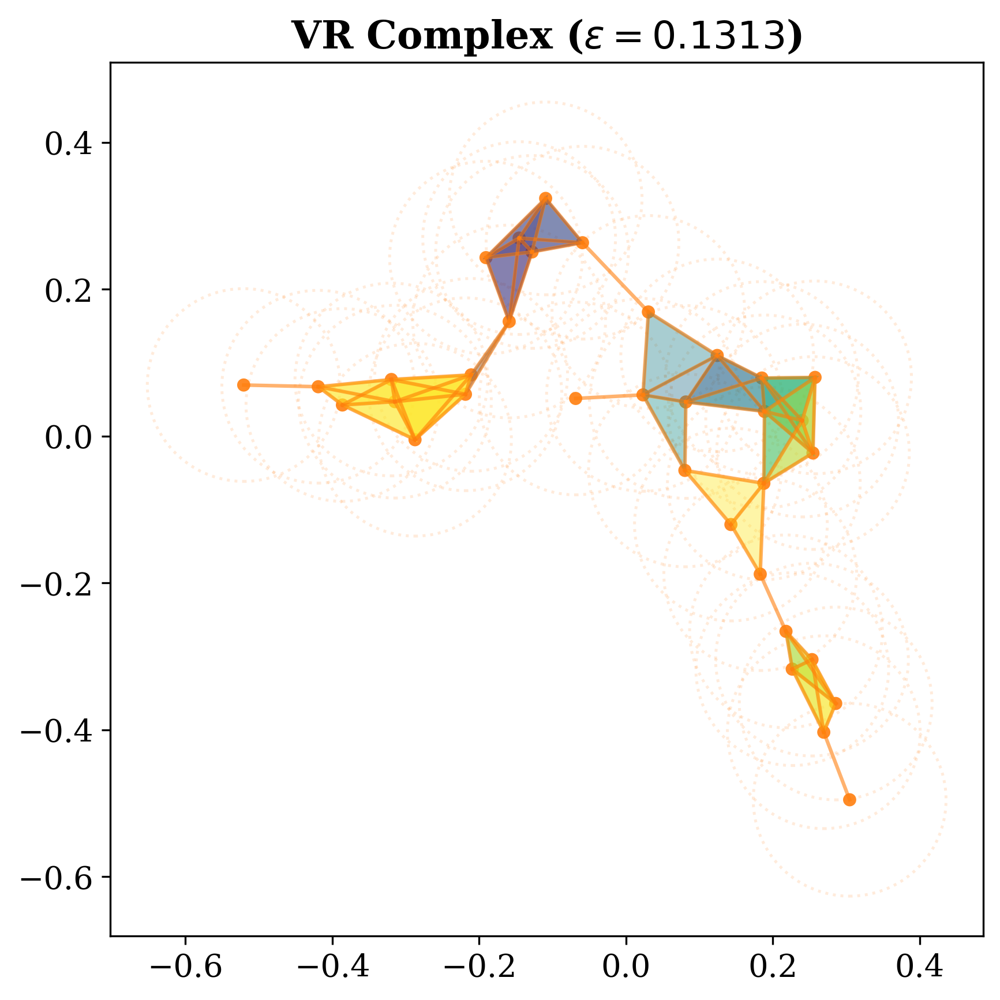


Processing Mapper graph for alpha = 50%
For alpha = 50%, N = 6


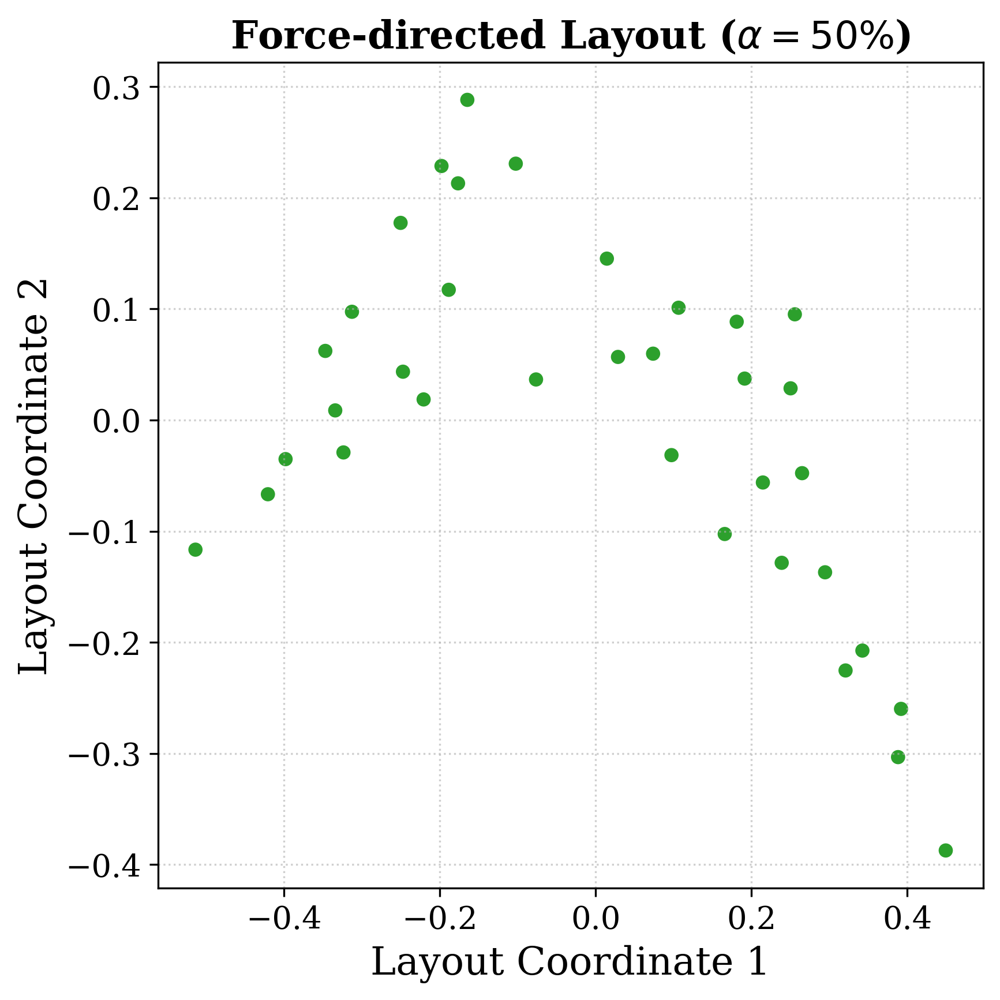


--- Topological Analysis on 2D Layout (alpha = 50%) ---


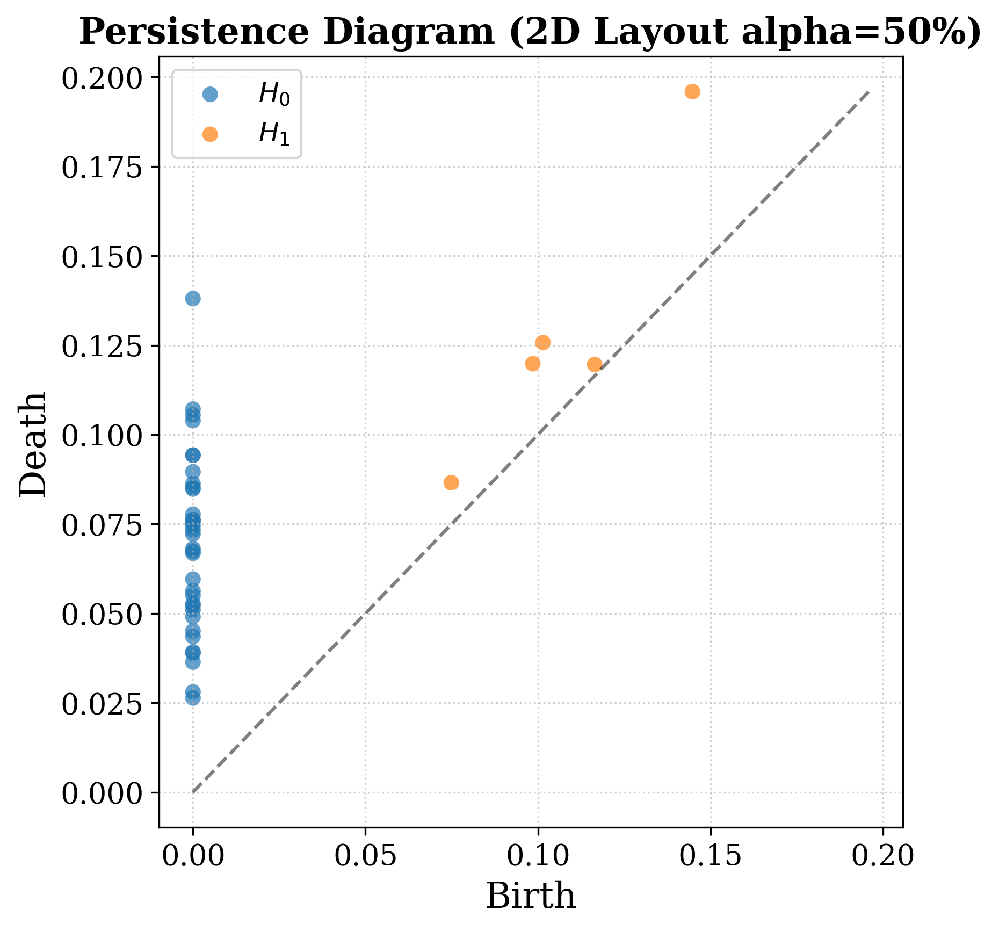

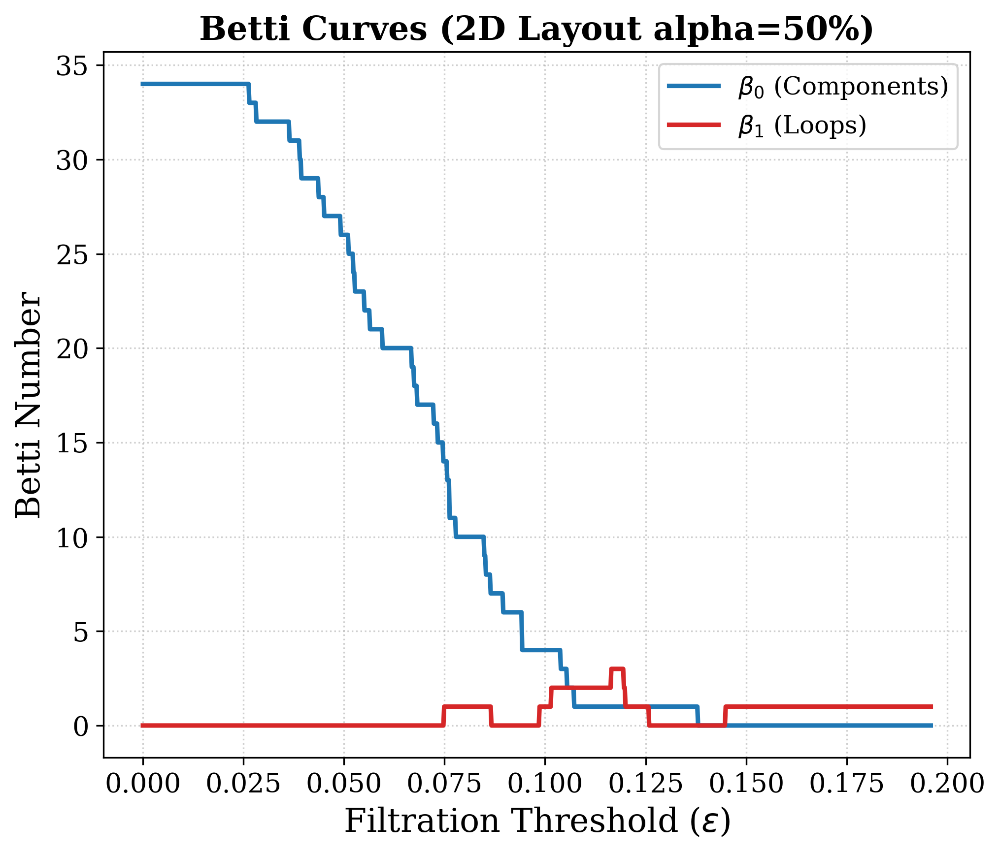

[2D Layout alpha=50%] Betti-1 value 3.0 has range [0.1165, 0.1194]
[2D Layout alpha=50%] Betti-1 value 2.0 has range [0.1016, 0.1163]
[2D Layout alpha=50%] Betti-1 value 2.0 has range [0.1196, 0.1198]
[2D Layout alpha=50%] Betti-1 value 1.0 has range [0.0749, 0.0865]
[2D Layout alpha=50%] Betti-1 value 1.0 has range [0.0986, 0.1014]
[2D Layout alpha=50%] Betti-1 value 1.0 has range [0.1200, 0.1257]
[2D Layout alpha=50%] Betti-1 value 1.0 has range [0.1449, 0.1959]


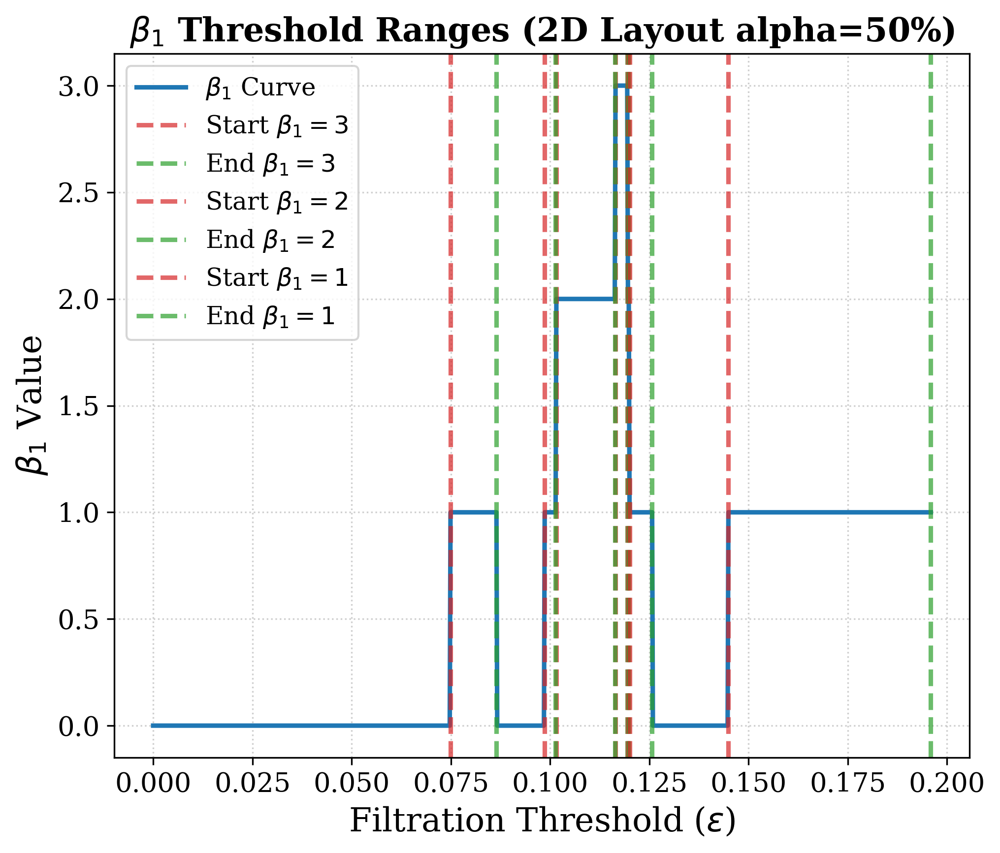

[2D Layout alpha=50%] Betti-1 value 3.0 total range: 0.0029
[2D Layout alpha=50%] Betti-1 value 2.0 total range: 0.0149
[2D Layout alpha=50%] Betti-1 value 1.0 total range: 0.0142

[2D Layout alpha=50%] Highest range Betti-1: 2.0 (total range = 0.0149)
[2D Layout alpha=50%] Raw midpoint epsilon threshold: 0.1107
|Betti_1_1 - Betti_1_2| = |2.0 - 2.0| = 0.0
Betti condition satisfied.


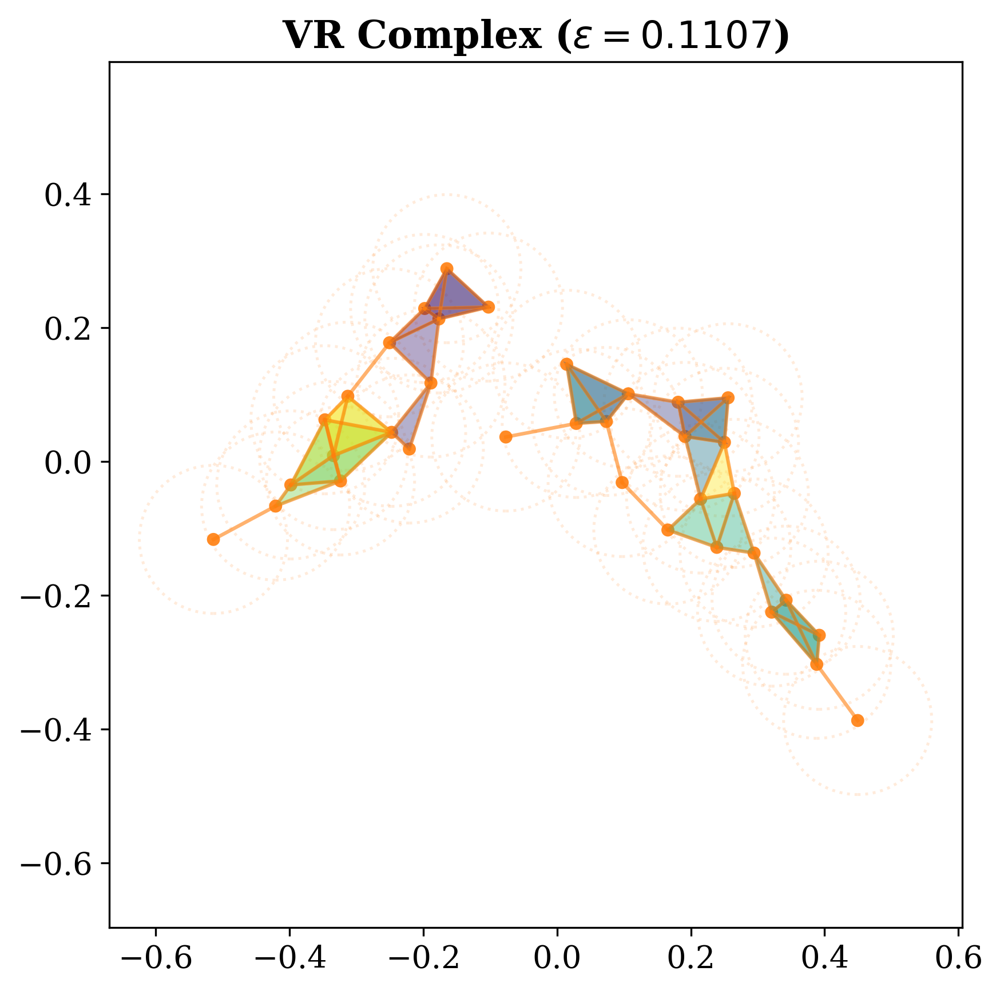


Processing Mapper graph for alpha = 55%
For alpha = 55%, N = 7


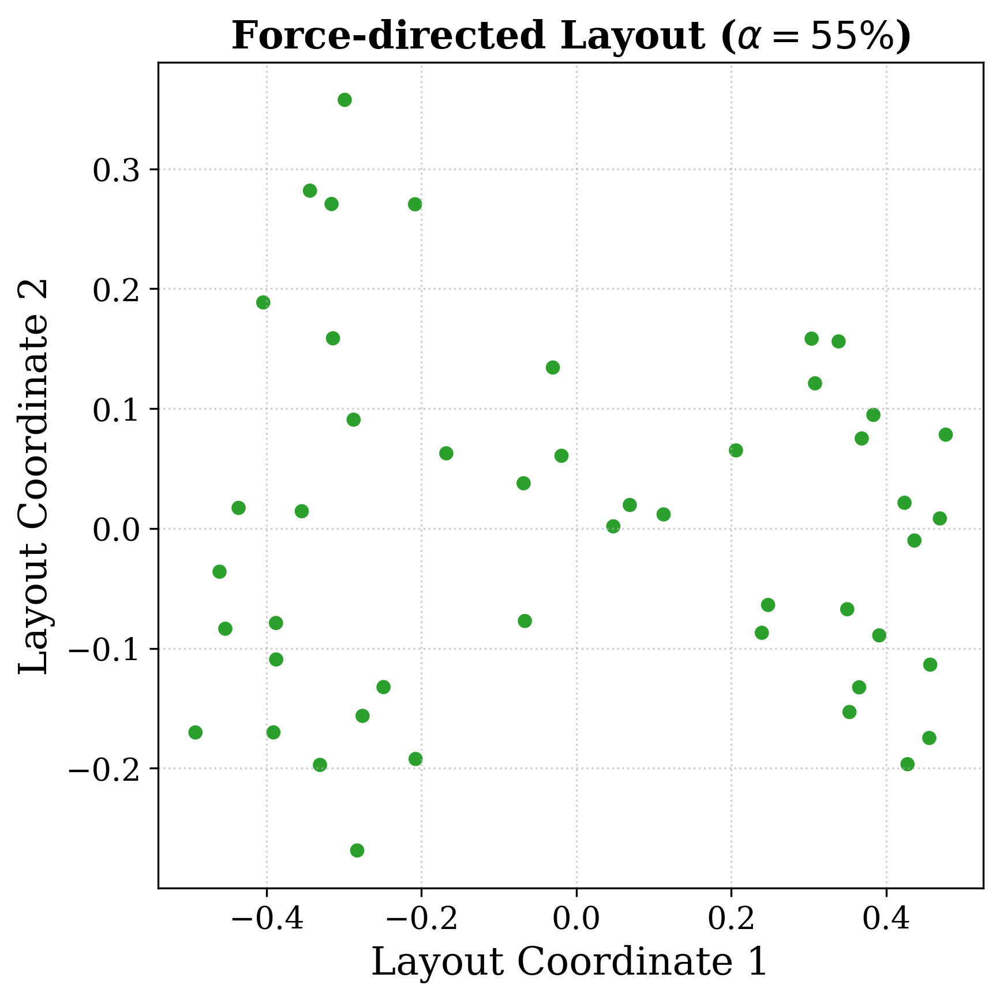


--- Topological Analysis on 2D Layout (alpha = 55%) ---


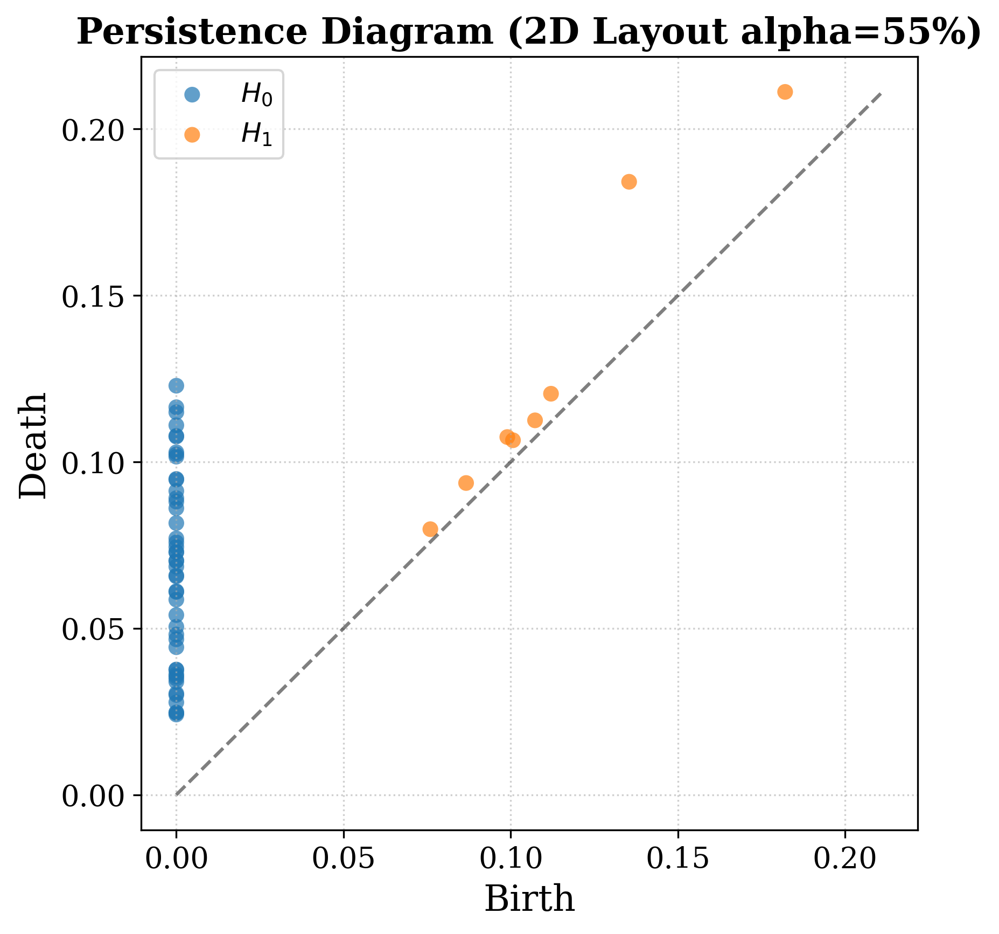

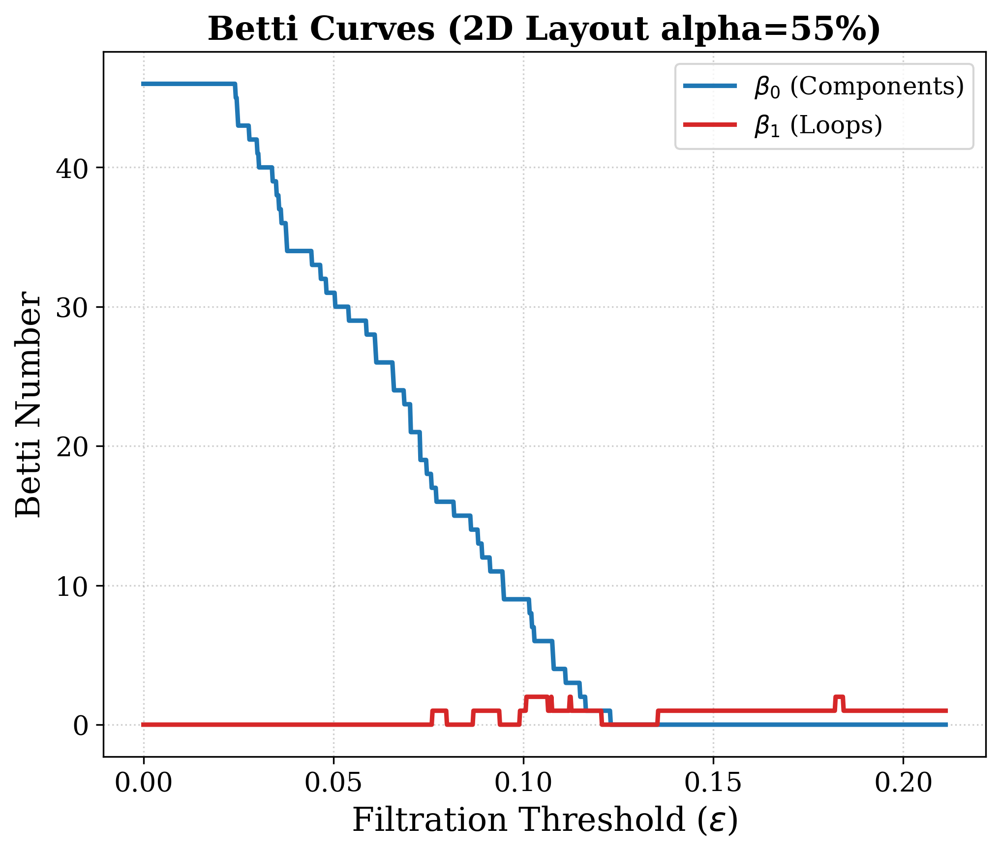

[2D Layout alpha=55%] Betti-1 value 2.0 has range [0.1008, 0.1063]
[2D Layout alpha=55%] Betti-1 value 2.0 has range [0.1074, 0.1074]
[2D Layout alpha=55%] Betti-1 value 2.0 has range [0.1122, 0.1124]
[2D Layout alpha=55%] Betti-1 value 2.0 has range [0.1822, 0.1841]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.0761, 0.0797]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.0869, 0.0936]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.0991, 0.1006]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.1065, 0.1072]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.1076, 0.1120]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.1127, 0.1205]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.1355, 0.1820]
[2D Layout alpha=55%] Betti-1 value 1.0 has range [0.1843, 0.2112]


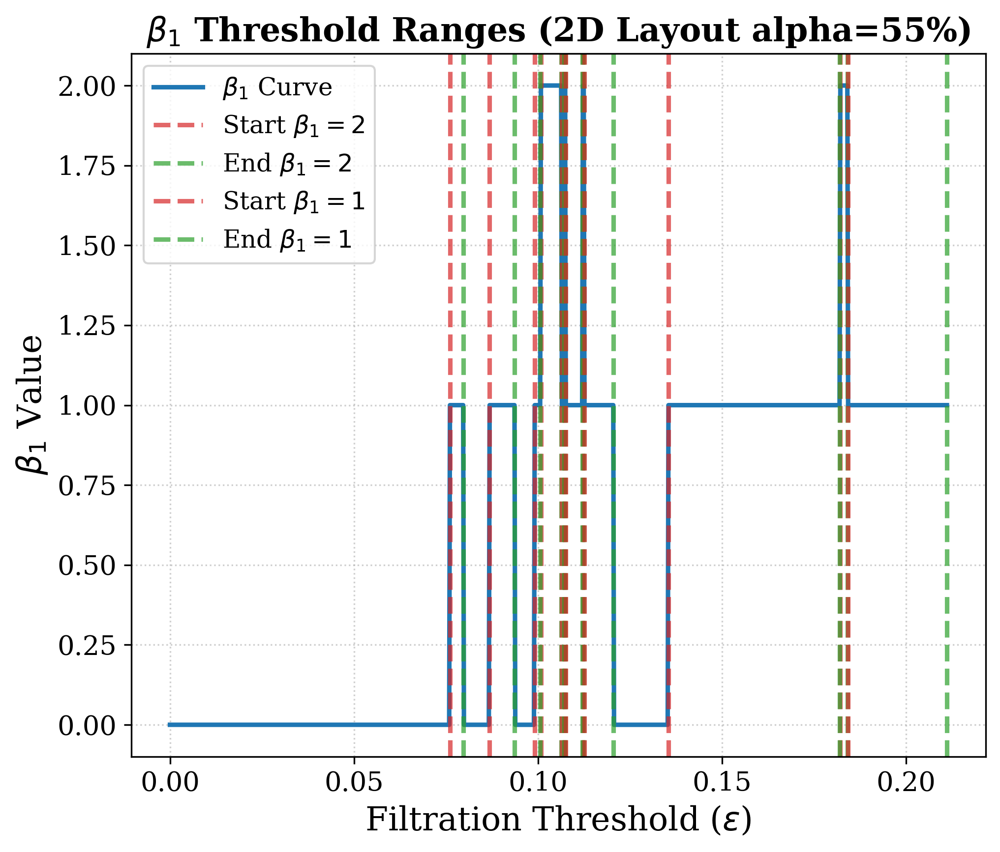

[2D Layout alpha=55%] Betti-1 value 2.0 total range: 0.0076
[2D Layout alpha=55%] Betti-1 value 1.0 total range: 0.0196

[2D Layout alpha=55%] Highest range Betti-1: 1.0 (total range = 0.0196)
[2D Layout alpha=55%] Raw midpoint epsilon threshold: 0.1436
|Betti_1_1 - Betti_1_2| = |2.0 - 1.0| = 1.0
Betti condition satisfied.


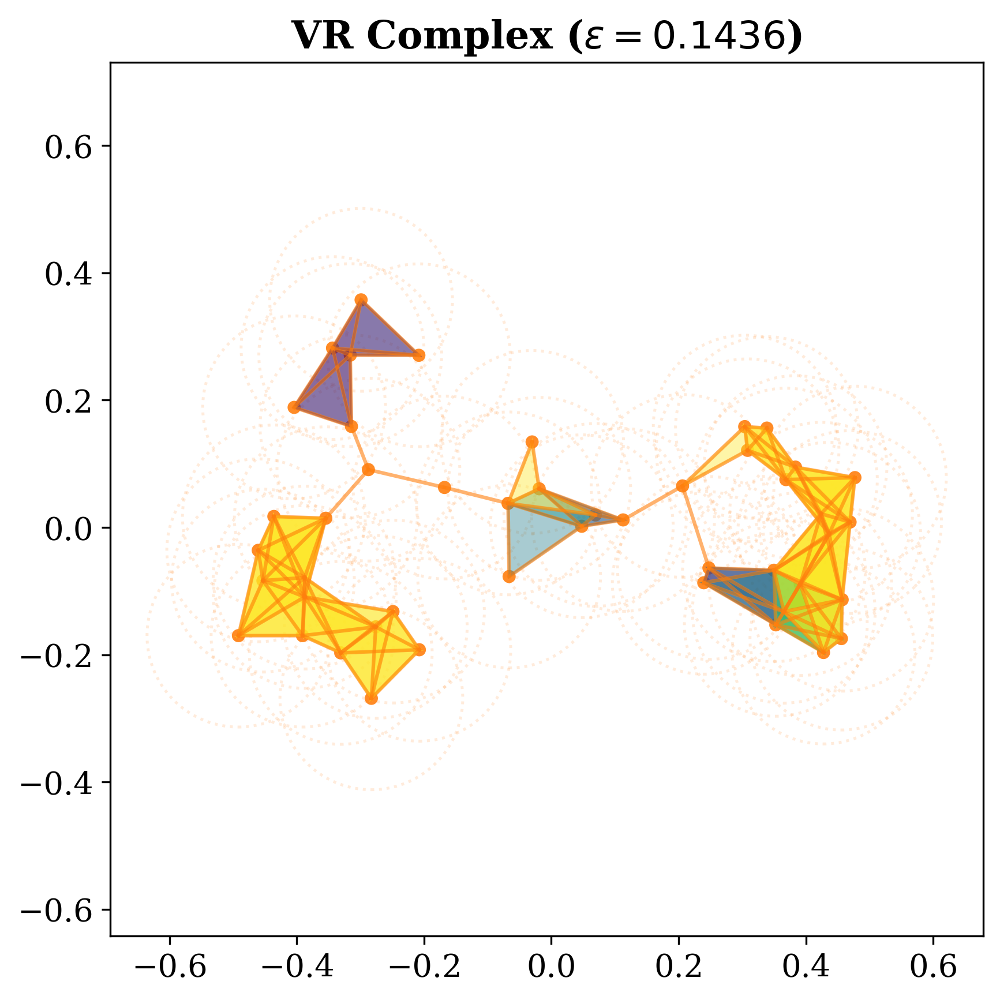


Processing Mapper graph for alpha = 60%
For alpha = 60%, N = 8


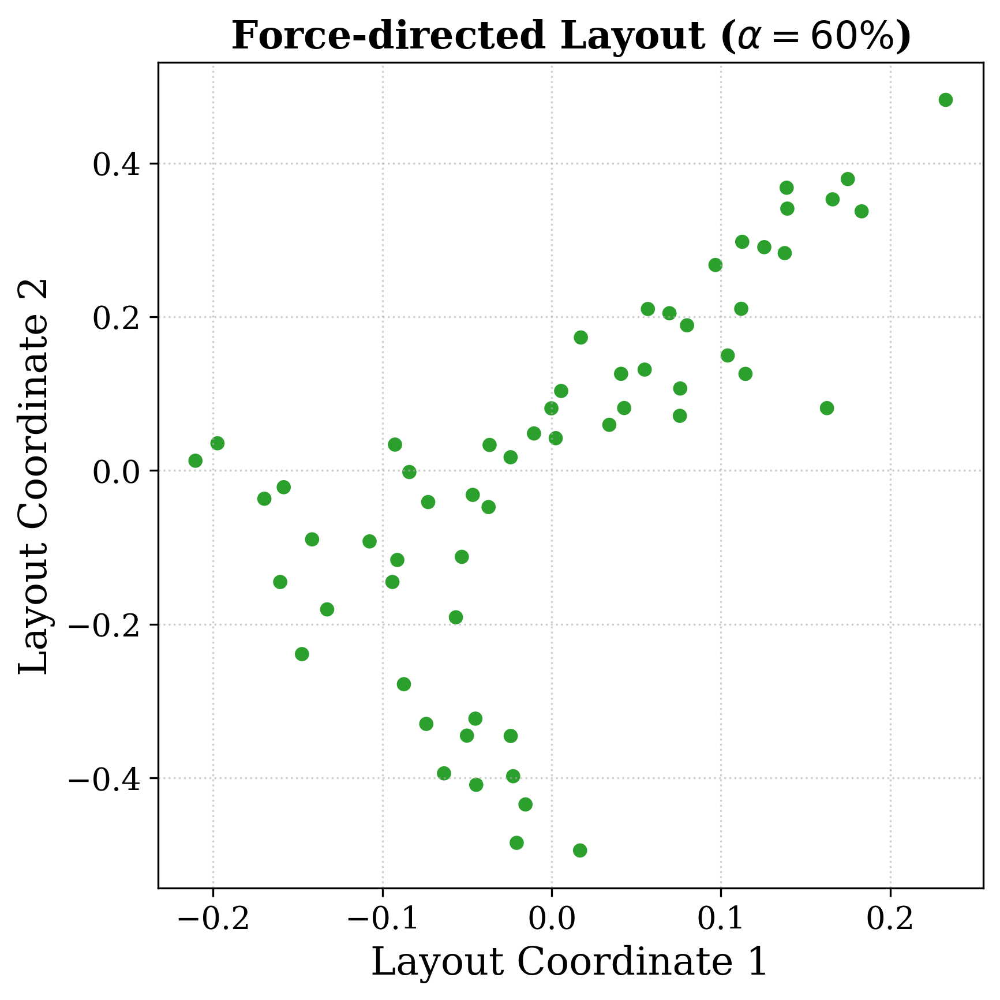


--- Topological Analysis on 2D Layout (alpha = 60%) ---


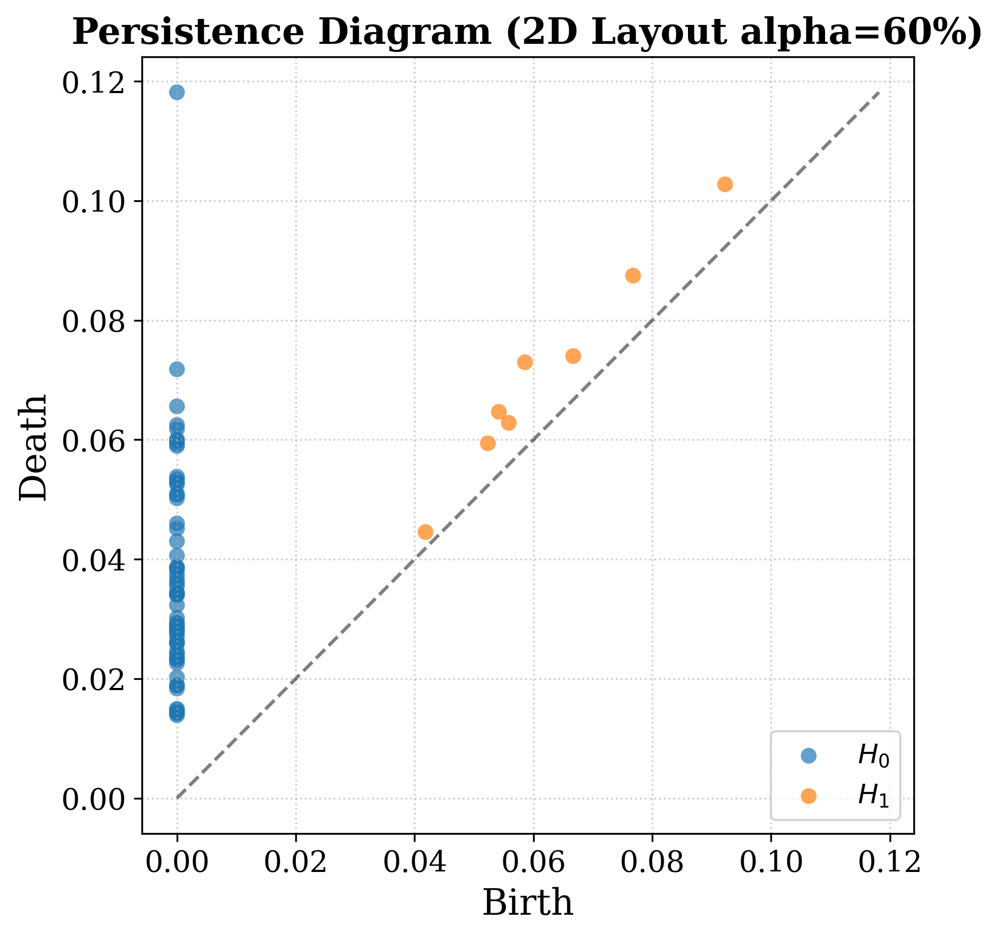

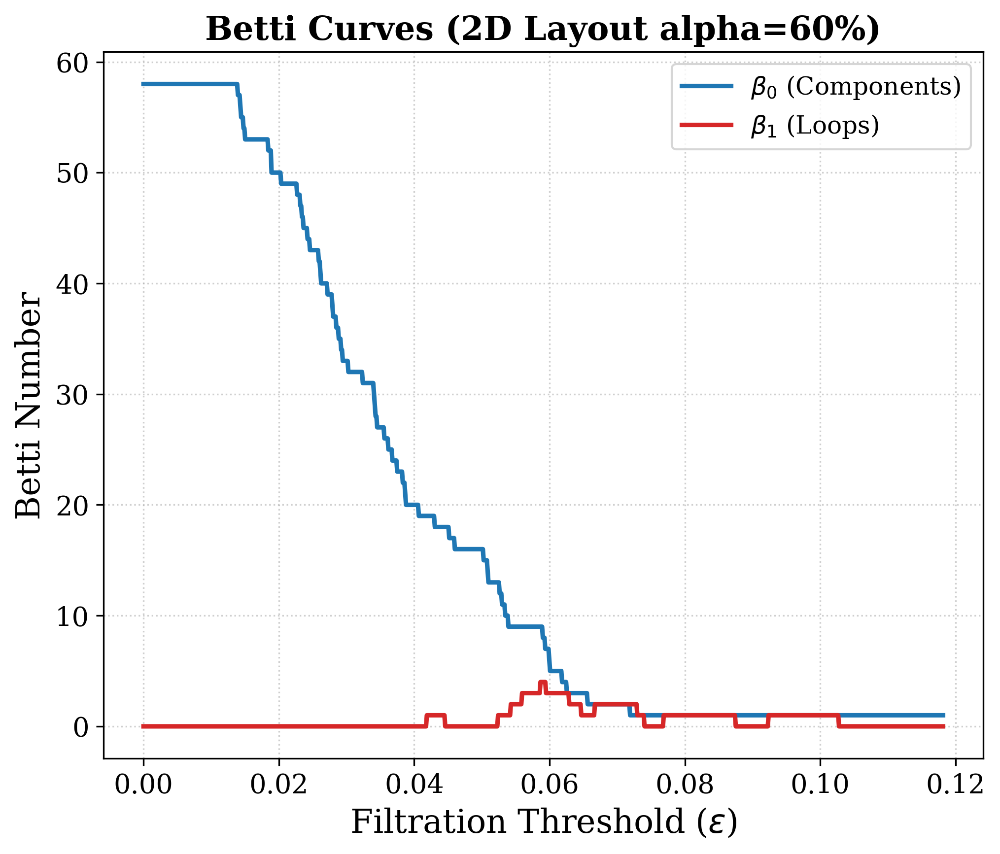

[2D Layout alpha=60%] Betti-1 value 4.0 has range [0.0587, 0.0594]
[2D Layout alpha=60%] Betti-1 value 3.0 has range [0.0559, 0.0585]
[2D Layout alpha=60%] Betti-1 value 3.0 has range [0.0595, 0.0628]
[2D Layout alpha=60%] Betti-1 value 2.0 has range [0.0543, 0.0558]
[2D Layout alpha=60%] Betti-1 value 2.0 has range [0.0629, 0.0646]
[2D Layout alpha=60%] Betti-1 value 2.0 has range [0.0667, 0.0729]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0419, 0.0445]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0524, 0.0542]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0647, 0.0666]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0730, 0.0739]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0769, 0.0874]
[2D Layout alpha=60%] Betti-1 value 1.0 has range [0.0924, 0.1027]


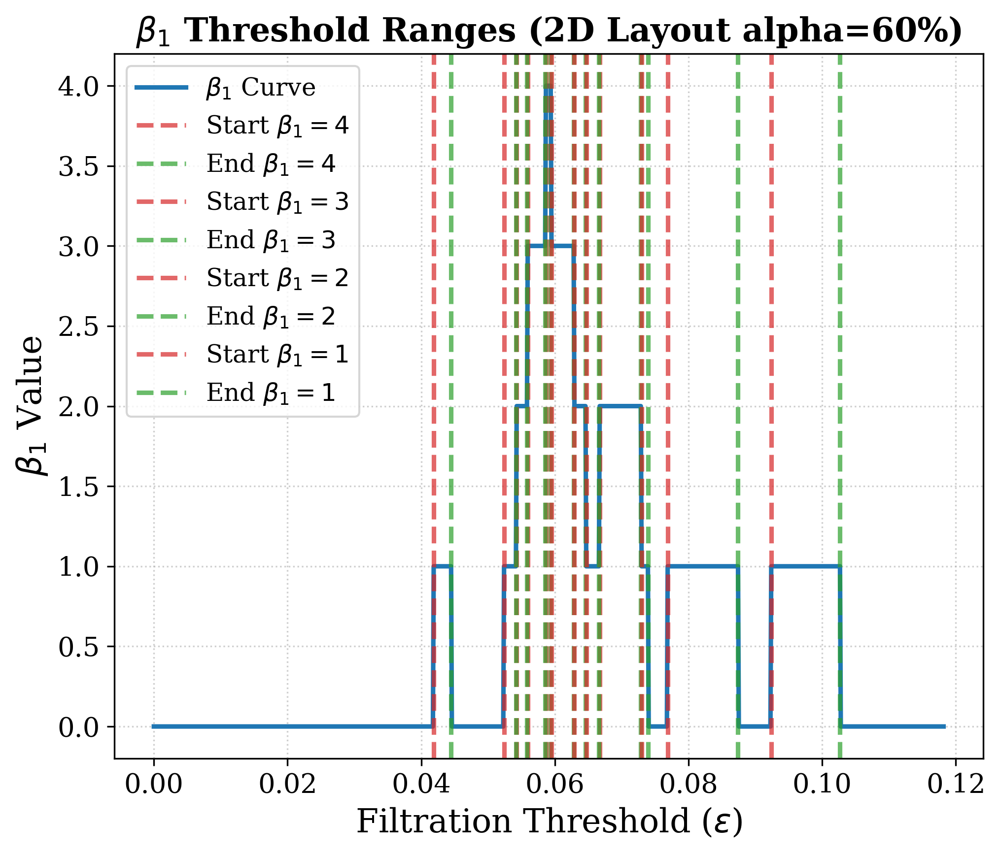

[2D Layout alpha=60%] Betti-1 value 4.0 total range: 0.0007
[2D Layout alpha=60%] Betti-1 value 3.0 total range: 0.0059
[2D Layout alpha=60%] Betti-1 value 2.0 total range: 0.0093
[2D Layout alpha=60%] Betti-1 value 1.0 total range: 0.0056

[2D Layout alpha=60%] Highest range Betti-1: 2.0 (total range = 0.0093)
[2D Layout alpha=60%] Raw midpoint epsilon threshold: 0.0636
|Betti_1_1 - Betti_1_2| = |2.0 - 2.0| = 0.0
Betti condition satisfied.


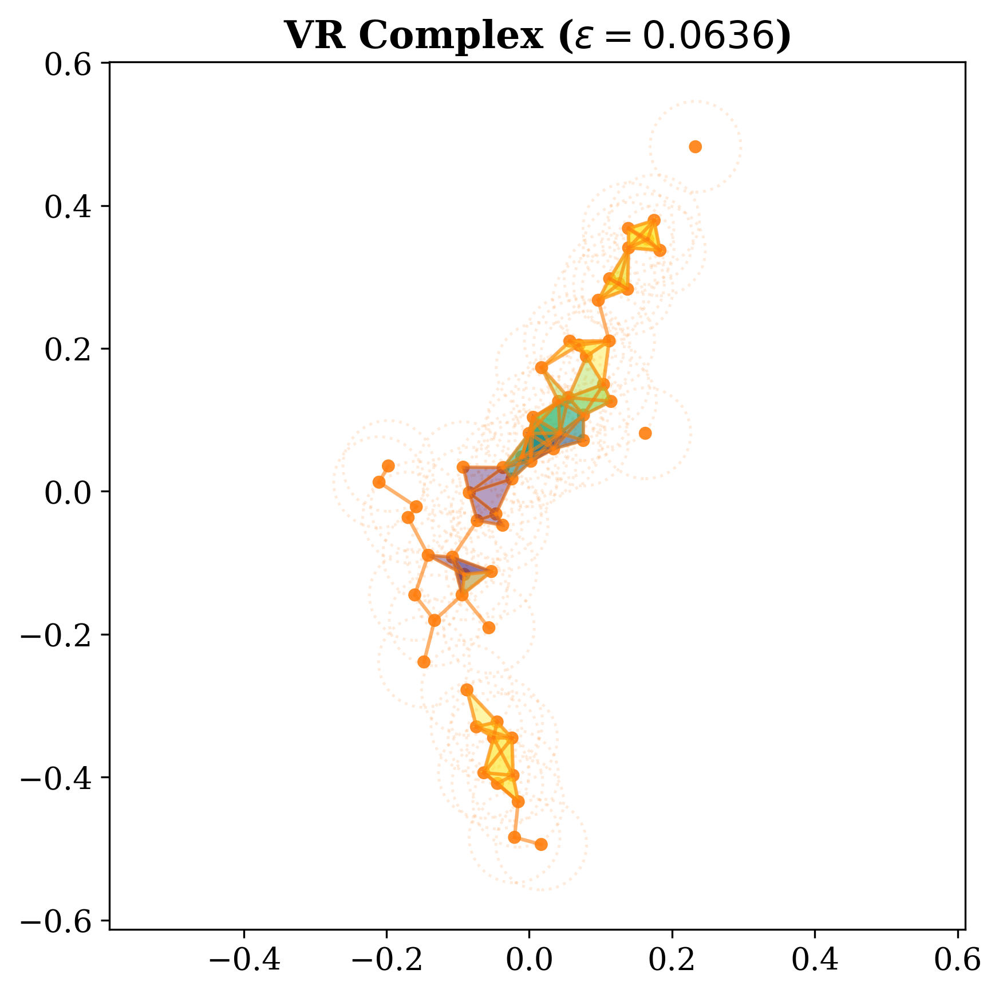


Results DataFrame:
   %overlap  N value  Betti_1_1  Betti_1_2  epsilon_1  epsilon_2
0        10        4        2.0        1.0   0.377819   0.490665
1        15        4        2.0        1.0   0.377819   0.567219
2        20        4        2.0        1.0   0.377819   0.025483
3        30        5        2.0        1.0   0.377819   0.142022
4        35        5        2.0        1.0   0.377819   0.331375
5        40        5        2.0        1.0   0.377819   0.365453
6        45        6        2.0        1.0   0.377819   0.131258
7        50        6        2.0        2.0   0.377819   0.110699
8        55        7        2.0        1.0   0.377819   0.143625
9        60        8        2.0        2.0   0.377819   0.063576


In [2]:
if __name__ == "__main__":
    filepath = r"clinical_corr_1.xlsx"
    
    # Load Excel file and convert to square matrix
    corr_df = pd.read_excel(filepath, index_col=0)
    corr_matrix = corr_df.to_numpy()

    # Run pipeline
    results_df = process_correlation_data(corr_matrix, cutoff_betti=1)